<h1> NBA Player Improvement Predictor </h1> 

This project intends to build a model which can predict the improvement of an NBA player this year, based on his statistics of the past year. This model can be useful to NBA executives who are looking to trade players in both situations of:
 - Getting a new player into their team
 - Deciding whether to keep a player in the team or not

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
nba_data_raw = pd.read_csv(r'C:\\Users\\ASUS\\Desktop\\Kaggle\\NBA Data\\NBAData.csv')
nba_data_ws_raw = pd.read_csv(r'C:\\Users\\ASUS\\Desktop\\Kaggle\\NBA Data\\Seasons_Stats.csv')[["Year","Player","Age","Tm","WS","WS/48"]]

In [3]:
nba_data_ws_raw.rename(columns = {"Player":"Name"},inplace= True)
nba_data_ws_raw.head(10)

,Year,Name,Age,Tm,WS,WS/48
0,1950.0,Curly Armstrong,31.0,FTW,3.5,NaN
1,1950.0,Cliff Barker,29.0,INO,2.2,NaN
2,1950.0,Leo Barnhorst,25.0,CHS,3.6,NaN
3,1950.0,Ed Bartels,24.0,TOT,-0.6,NaN
4,1950.0,Ed Bartels,24.0,DNN,-0.6,NaN
5,1950.0,Ed Bartels,24.0,NYK,0.0,NaN
6,1950.0,Ralph Beard,22.0,INO,4.8,NaN
7,1950.0,Gene Berce,23.0,TRI,-0.1,NaN
8,1950.0,Charlie Black,28.0,TOT,2.8,NaN
9,1950.0,Charlie Black,28.0,FTW,1.5,NaN


In [4]:
'''
prior_name = ""
nba_data_raw["Start Year"] = np.nan
start_year = int(nba_data_raw.iloc[0,1].split('-')[0])
nba_data_raw["Start Year"].iloc[0] = start_year
for i in range(1,nba_data_raw.shape[0]):
    prior_name = nba_data_raw.iloc[i-1,0]
    current_name = nba_data_raw.iloc[i,0]
    if current_name != prior_name:
        start_year = int(nba_data_raw.iloc[i,1].split('-')[0])
        nba_data_raw["Start Year"].iloc[i] = start_year
    else:
        nba_data_raw["Start Year"].iloc[i] = start_year
'''

'\nprior_name = ""\nnba_data_raw["Start Year"] = np.nan\nstart_year = int(nba_data_raw.iloc[0,1].split(\'-\')[0])\nnba_data_raw["Start Year"].iloc[0] = start_year\nfor i in range(1,nba_data_raw.shape[0]):\n    prior_name = nba_data_raw.iloc[i-1,0]\n    current_name = nba_data_raw.iloc[i,0]\n    if current_name != prior_name:\n        start_year = int(nba_data_raw.iloc[i,1].split(\'-\')[0])\n        nba_data_raw["Start Year"].iloc[i] = start_year\n    else:\n        nba_data_raw["Start Year"].iloc[i] = start_year\n'

In [5]:
#adjusting the year field to season
nba_data_ws = nba_data_ws_raw.loc[nba_data_ws_raw["Year"] >= 1981]
nba_data_ws["Season"] = nba_data_ws["Year"].apply(lambda x: str(int(x - 1)) + '-' + str(int(x))[-2:])


In [6]:
nba_data_ws["Surname"] = nba_data_ws["Name"].apply(lambda x:x.split()[1])
nba_data_ws["First Name"] = nba_data_ws["Name"].apply(lambda x:x.split()[0])
nba_data_ws.sort_values(by = ["Surname","First Name","Year"],axis = 0).head(20)


,Year,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
10007,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
10449,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
10908,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
10909,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
10910,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
11358,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
11840,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
11841,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
11842,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
6085,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [7]:
nba_data_ws.sort_values(by = ["Surname","First Name","Year"],axis = 0,inplace=True)
nba_data_ws.head(30)

,Year,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
10007,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
10449,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
10908,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
10909,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
10910,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
11358,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
11840,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
11841,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
11842,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
6085,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [8]:
'''
nba_data_ws.drop('Surname',axis = 1, inplace=True)
'''
nba_data_ws.reset_index(drop = True, inplace = True)
nba_data_ws.head(10)

,Year,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar*,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [9]:
nba_data_ws["Name"] = nba_data_ws["Name"].apply(lambda x: x.strip('*'))
nba_data_ws.head(20)

,Year,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar*,Kareem


In [10]:
nba_data_ws["Surname"] = nba_data_ws["Surname"].apply(lambda x: x.strip('*'))
nba_data_ws.head(20)

,Year,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
0,1991.0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa
1,1992.0,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa
2,1993.0,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
3,1993.0,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa
4,1993.0,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa
5,1994.0,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa
6,1995.0,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
7,1995.0,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa
8,1995.0,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa
9,1981.0,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem


In [11]:
nba_data_ws.drop("Year",axis = 1, inplace = True)

In [12]:
#1) Obtain only TOT and remove other instances of same season
#2) Remove seasons where one plays less than 20 games less than 100 minutes per season
#There are a lot of situations where the same player plays for multiple teams in the same season as they are traded during the season. Such players have a TOT entry as for Team ("Tm")

nba_data_raw.loc[nba_data_raw["Tm"] == "TOT"]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
6,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
42,4,Tariq Abdul-Wahad,1999-00,25.0,TOT,NBA,SG,61.0,56.0,25.9,...,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,1997
46,4,Tariq Abdul-Wahad,2001-02,27.0,TOT,NBA,SG,24.0,12.0,18.4,...,1.7,1.8,3.5,1.0,0.8,0.4,1.1,2.3,5.6,1997
57,5,Shareef Abdur-Rahim,2003-04,27.0,TOT,NBA,PF,85.0,56.0,31.6,...,2.2,5.3,7.5,2.0,0.8,0.4,2.2,2.6,16.3,1996
68,6,Tom Abernethy,1980-81,26.0,TOT,NBA,SF,39.0,NaN,7.6,...,0.5,0.7,1.2,0.5,0.2,0.1,0.2,0.9,1.6,1976
78,9,Alex Acker,2008-09,26.0,TOT,NBA,SG,25.0,0.0,8.0,...,0.3,0.6,1.0,0.5,0.2,0.2,0.3,0.4,2.9,2005
86,10,Mark Acres,1992-93,30.0,TOT,NBA,C,18.0,7.0,14.9,...,1.4,2.3,3.7,0.3,0.2,0.3,0.7,1.9,3.6,1985
90,11,Quincy Acy,2013-14,23.0,TOT,NBA,SF,63.0,0.0,13.4,...,1.1,2.3,3.4,0.4,0.4,0.4,0.5,1.9,2.7,2012
95,11,Quincy Acy,2016-17,26.0,TOT,NBA,PF,38.0,1.0,14.7,...,0.5,2.5,3.0,0.5,0.4,0.4,0.6,1.8,5.8,2012


In [13]:
collist = nba_data_raw.columns.tolist()[1:-1]
nan_idx = nba_data_raw[nba_data_raw[collist].isnull().apply(lambda x:all(x),axis = 1)].index.values.tolist()
nba_data_raw = nba_data_raw.drop(nan_idx).reset_index(drop = True)
nba_data_raw[:40]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1992-93,24.0,MIL,NBA,PF,12.0,0.0,13.3,...,1.0,2.1,3.1,0.8,0.5,0.3,1.1,2.0,5.3,1990
4,1,Alaa Abdelnaby,1992-93,24.0,BOS,NBA,PF,63.0,52.0,18.3,...,1.8,3.0,4.8,0.3,0.3,0.3,1.3,2.6,8.2,1990
5,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
6,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
7,1,Alaa Abdelnaby,1994-95,26.0,SAC,NBA,PF,51.0,0.0,9.3,...,0.7,1.4,2.1,0.3,0.3,0.2,0.8,2.0,5.0,1990
8,1,Alaa Abdelnaby,1994-95,26.0,PHI,NBA,PF,3.0,0.0,10.0,...,1.0,1.7,2.7,0.0,0.0,0.0,1.7,0.7,0.7,1990
9,2,Kareem Abdul-Jabbar,1969-70,22.0,MIL,NBA,C,82.0,NaN,43.1,...,NaN,NaN,14.5,4.1,NaN,NaN,NaN,3.5,28.8,1969


In [14]:

import unidecode

nba_data_raw["Name"] = nba_data_raw["Name"].apply(lambda x: unidecode.unidecode(x))
nba_data_ws["Name"] = nba_data_ws["Name"].apply(lambda x: unidecode.unidecode(x))


In [15]:
nba_data_raw["Name"] = nba_data_raw["Name"].apply(lambda x : ''.join(list(filter(lambda y: y!='.',list(x)))))

nba_data_ws["Name"] = nba_data_ws["Name"].apply(lambda x : ''.join(list(filter(lambda y: y!='.',list(x)))))

In [16]:
nba_data_ws.loc[nba_data_ws["Tm"] == "TOT"]

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa
6,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa
29,Tariq Abdul-Wahad,25.0,TOT,2.2,0.068,1999-00,Abdul-Wahad,Tariq
33,Tariq Abdul-Wahad,27.0,TOT,0.0,-0.003,2001-02,Abdul-Wahad,Tariq
44,Shareef Abdur-Rahim,27.0,TOT,8.1,0.145,2003-04,Abdur-Rahim,Shareef
51,Tom Abernethy,26.0,TOT,0.4,0.062,1980-81,Abernethy,Tom
56,Alex Acker,26.0,TOT,0.0,-0.011,2008-09,Acker,Alex
64,Mark Acres,30.0,TOT,0.3,0.056,1992-93,Acres,Mark
68,Quincy Acy,23.0,TOT,1.5,0.086,2013-14,Acy,Quincy
73,Quincy Acy,26.0,TOT,0.9,0.082,2016-17,Acy,Quincy


In [17]:
nba_data_raw.shape

(22338, 33)

In [18]:
nba_data_ws.shape

(18570, 8)

In [19]:
merged_df = pd.merge(nba_data_ws,nba_data_raw[["PlayerID","Name","Season","Tm","Age"]],how = 'inner',on=['Name','Season','Tm','Age'])
merged_df.head(30)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,24.0,MIL,0.1,0.035,1992-93,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,24.0,BOS,1.9,0.079,1992-93,Abdelnaby,Alaa,1
5,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
6,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
7,Alaa Abdelnaby,26.0,SAC,0.6,0.058,1994-95,Abdelnaby,Alaa,1
8,Alaa Abdelnaby,26.0,PHI,-0.3,-0.466,1994-95,Abdelnaby,Alaa,1
9,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2


In [20]:
merged_df.shape

(18324, 9)

In [21]:
merged_df.loc[merged_df["WS/48"].isna(),"WS/48"] = 0.0
merged_df.isnull().sum()

Name          0
Age           0
Tm            0
WS            0
WS/48         0
Season        0
Surname       0
First Name    0
PlayerID      0
dtype: int64

In [22]:
merged_df.to_csv("merged_data.csv",index = False)

In [23]:
#some players who were transferred in the middle of the season have there stats summed up to a row with TOT. This row shall be used for the players statistics for that year. Hence other entries for that year will be removed
idx_drop = []
key_list = list()
player_grp = nba_data_raw.groupby(['PlayerID','Name'])

for key,group in player_grp:
    key_list.append(key)

for key in key_list:
    player_stats = player_grp.get_group(key)
    years = player_stats.loc[player_stats['Tm'] == 'TOT']['Season'].tolist()
    idx = player_stats.loc[(player_stats['Season'].apply(lambda x: x in years)) & (player_stats['Tm'] != "TOT")].index.values.tolist()
    if len(idx) != 0:
        idx_drop.extend(idx)

In [24]:
#dropping all indices with entries which are not TOT for a given year
nba_data_df = nba_data_raw.drop(idx_drop).reset_index(drop = True)
nba_data_df.head(50)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
5,2,Kareem Abdul-Jabbar,1969-70,22.0,MIL,NBA,C,82.0,NaN,43.1,...,NaN,NaN,14.5,4.1,NaN,NaN,NaN,3.5,28.8,1969
6,2,Kareem Abdul-Jabbar,1970-71,23.0,MIL,NBA,C,82.0,NaN,40.1,...,NaN,NaN,16.0,3.3,NaN,NaN,NaN,3.2,31.7,1969
7,2,Kareem Abdul-Jabbar,1971-72,24.0,MIL,NBA,C,81.0,NaN,44.2,...,NaN,NaN,16.6,4.6,NaN,NaN,NaN,2.9,34.8,1969
8,2,Kareem Abdul-Jabbar,1972-73,25.0,MIL,NBA,C,76.0,NaN,42.8,...,NaN,NaN,16.1,5.0,NaN,NaN,NaN,2.7,30.2,1969
9,2,Kareem Abdul-Jabbar,1973-74,26.0,MIL,NBA,C,81.0,NaN,43.8,...,3.5,11.0,14.5,4.8,1.4,3.5,NaN,2.9,27.0,1969


In [25]:
nba_data_df.shape

(18389, 33)

In [26]:
idx_drop_ws = []
key_list_ws = list()
player_grp_ws = merged_df.groupby(['PlayerID','Name'])

for key,group in player_grp_ws:
    key_list_ws.append(key)

for key in key_list_ws:
    player_stats = player_grp_ws.get_group(key)
    years = player_stats.loc[player_stats['Tm'] == 'TOT']['Season'].tolist()
    idx = player_stats.loc[(player_stats['Season'].apply(lambda x: x in years)) & (player_stats['Tm'] != "TOT")].index.values.tolist()
    if len(idx) != 0:
        idx_drop_ws.extend(idx)

In [27]:
merged_df = merged_df.drop(idx_drop_ws).reset_index(drop = True)
merged_df.head(50)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,Abdul-Jabbar,Kareem,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,Abdul-Jabbar,Kareem,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,Abdul-Jabbar,Kareem,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,Abdul-Jabbar,Kareem,2


In [28]:
merged_df.shape

(15051, 9)

In [29]:
#there are players with the same name. Although there PlayerID is unique, we shall ammend there names to include there player ID with it
repeated_name_ids = []
def getplayerid(id_namepair,name):
    if id_namepair[1] == name:
        return [id_namepair[0]]

unique_names = list(set(nba_data_df["Name"]))
names = [i[1] for i in key_list]
player_ids = [i[0] for i in key_list]
#if repeated names were not next to each other, this would work
'''
for name in unique_names:
    if names.count(name) > 1:
        repeated_name_ids.extend(map(lambda id_namepair,name:getplayerid(id_namepair,name),key_list,[name]*len(key_list)))
'''
#as players with unique names will be listed next to each other as they were scraped off the web as such, we use the following technique to get the PlayerIDs of the repeated names
for name in unique_names:
    if names.count(name) > 1:
        repeated_name_ids.extend([player_ids[names.index(name)] + i for i in range(0,names.count(name))])

In [30]:
nba_data_df.loc[nba_data_df["PlayerID"].apply(lambda x:x in repeated_name_ids), "Name"] = nba_data_df["Name"] + "_" + nba_data_df["PlayerID"].astype(str)

nba_data_df.loc[nba_data_df["PlayerID"].apply(lambda x:x in repeated_name_ids)]

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
2135,365,Dee Brown_365,1990-91,22.0,BOS,NBA,PG,82.0,5.0,23.7,...,0.5,1.7,2.2,4.2,1.0,0.2,1.7,2.0,8.7,1990
2136,365,Dee Brown_365,1991-92,23.0,BOS,NBA,PG,31.0,20.0,28.5,...,0.5,2.1,2.5,5.3,1.1,0.2,1.9,2.4,11.7,1990
2137,365,Dee Brown_365,1992-93,24.0,BOS,NBA,PG,80.0,48.0,28.2,...,0.6,2.5,3.1,5.8,1.7,0.4,1.7,2.5,10.9,1990
2138,365,Dee Brown_365,1993-94,25.0,BOS,NBA,SG,77.0,76.0,37.2,...,0.8,3.1,3.9,4.5,2.0,0.6,1.6,2.7,15.5,1990
2139,365,Dee Brown_365,1994-95,26.0,BOS,NBA,SG,79.0,69.0,35.3,...,0.8,2.4,3.2,3.8,1.4,0.6,1.8,2.3,15.6,1990
2140,365,Dee Brown_365,1995-96,27.0,BOS,NBA,PG,65.0,23.0,24.5,...,0.6,1.5,2.1,2.2,1.2,0.2,1.1,1.8,10.7,1990
2141,365,Dee Brown_365,1996-97,28.0,BOS,NBA,PG,21.0,2.0,24.9,...,0.4,1.9,2.3,3.2,1.5,0.3,1.1,2.1,7.6,1990
2142,365,Dee Brown_365,1997-98,29.0,TOT,NBA,SG,72.0,12.0,23.9,...,0.3,1.8,2.1,2.1,1.1,0.3,1.0,1.7,9.1,1990
2143,365,Dee Brown_365,1998-99,30.0,TOR,NBA,PG,49.0,0.0,28.1,...,0.3,1.8,2.1,2.9,1.1,0.2,1.6,1.5,11.2,1990
2144,365,Dee Brown_365,1999-00,31.0,TOR,NBA,PG,38.0,12.0,17.7,...,0.2,1.2,1.4,2.3,0.6,0.1,1.0,1.6,6.9,1990


In [31]:
repeated_name_ids_ws = []
unique_names_ws = list(set(merged_df["Name"]))
names_ws = [i[1] for i in key_list_ws]
player_ids_ws = [i[0] for i in key_list_ws]

for name in unique_names_ws:
    if names_ws.count(name) > 1:
        repeated_name_ids_ws.extend([player_ids_ws[names_ws.index(name)] + i for i in range(0,names_ws.count(name))])

In [32]:
merged_df.loc[merged_df["PlayerID"].apply(lambda x:x in repeated_name_ids_ws), "Name"] = merged_df["Name"] + "_" + merged_df["PlayerID"].astype(str)

merged_df.loc[merged_df["PlayerID"].apply(lambda x:x in repeated_name_ids_ws)]

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
1737,Dee Brown_365,22.0,BOS,3.5,0.087,1990-91,Brown,Dee,365
1738,Dee Brown_365,23.0,BOS,1.0,0.055,1991-92,Brown,Dee,365
1739,Dee Brown_365,24.0,BOS,6.4,0.135,1992-93,Brown,Dee,365
1740,Dee Brown_365,25.0,BOS,6.4,0.108,1993-94,Brown,Dee,365
1741,Dee Brown_365,26.0,BOS,6.8,0.117,1994-95,Brown,Dee,365
1742,Dee Brown_365,27.0,BOS,2.4,0.073,1995-96,Brown,Dee,365
1743,Dee Brown_365,28.0,BOS,0.3,0.030,1996-97,Brown,Dee,365
1744,Dee Brown_365,29.0,TOT,3.4,0.095,1997-98,Brown,Dee,365
1745,Dee Brown_365,30.0,TOR,2.5,0.086,1998-99,Brown,Dee,365
1746,Dee Brown_365,31.0,TOR,0.8,0.057,1999-00,Brown,Dee,365


In [33]:
#As the 2020-2021 Season it still going on, this season will be dropped from any data analysis and training that is to be done 

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"] == "2020-21"].index.values.tolist()).reset_index(drop = True)
nba_data_df.loc[nba_data_df["Season"] == "2020-21"].index.values.tolist()

[]

In [34]:
#Dropping all seasons prior to the 1980-1981 season
before1980_seasons = [i for i in nba_data_df["Season"].unique().tolist() if int(i.split('-')[0])<1980]

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"].apply(lambda x : x in before1980_seasons)].index.values.tolist()).reset_index(drop = True)
nba_data_df.head(30)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990
5,2,Kareem Abdul-Jabbar,1980-81,33.0,LAL,NBA,C,80.0,NaN,37.2,...,2.5,7.8,10.3,3.4,0.7,2.9,3.1,3.1,26.2,1969
6,2,Kareem Abdul-Jabbar,1981-82,34.0,LAL,NBA,C,76.0,76.0,35.2,...,2.3,6.4,8.7,3.0,0.8,2.7,3.0,2.9,23.9,1969
7,2,Kareem Abdul-Jabbar,1982-83,35.0,LAL,NBA,C,79.0,79.0,32.3,...,2.1,5.4,7.5,2.5,0.8,2.2,2.5,2.8,21.8,1969
8,2,Kareem Abdul-Jabbar,1983-84,36.0,LAL,NBA,C,80.0,80.0,32.8,...,2.1,5.2,7.3,2.6,0.7,1.8,2.8,2.6,21.5,1969
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,2.1,5.8,7.9,3.2,0.8,2.1,2.5,3.0,22.0,1969


In [35]:
#We shall only use data from 1980-81 to 2016-2017 season as we only have WS values for this period of time
after2017_seasons = [i for i in nba_data_df["Season"] if int(i.split('-')[0])>=2017]

nba_data_df = nba_data_df.drop(nba_data_df.loc[nba_data_df["Season"].apply(lambda x: x in after2017_seasons)].index.values.tolist()).reset_index(drop = True)


In [36]:
nba_data_df.loc[nba_data_df["Season"] == "2019-20"].index.values.tolist()

[]

In [37]:
merged_df.head(20)

,Name,Age,Tm,WS,WS/48,Season,Surname,First Name,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,Abdelnaby,Alaa,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,Abdelnaby,Alaa,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,Abdelnaby,Alaa,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,Abdelnaby,Alaa,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,Abdelnaby,Alaa,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,Abdul-Jabbar,Kareem,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,Abdul-Jabbar,Kareem,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,Abdul-Jabbar,Kareem,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,Abdul-Jabbar,Kareem,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,Abdul-Jabbar,Kareem,2


In [38]:
merged_df.drop(['Surname','First Name'], axis = 1,inplace=True)
merged_df.head(10)

,Name,Age,Tm,WS,WS/48,Season,PlayerID
0,Alaa Abdelnaby,22.0,POR,0.5,0.079,1990-91,1
1,Alaa Abdelnaby,23.0,POR,2.1,0.110,1991-92,1
2,Alaa Abdelnaby,24.0,TOT,2.0,0.074,1992-93,1
3,Alaa Abdelnaby,25.0,BOS,-0.1,-0.032,1993-94,1
4,Alaa Abdelnaby,26.0,TOT,0.3,0.027,1994-95,1
5,Kareem Abdul-Jabbar,33.0,LAL,14.3,0.230,1980-81,2
6,Kareem Abdul-Jabbar,34.0,LAL,10.7,0.192,1981-82,2
7,Kareem Abdul-Jabbar,35.0,LAL,10.9,0.205,1982-83,2
8,Kareem Abdul-Jabbar,36.0,LAL,8.9,0.163,1983-84,2
9,Kareem Abdul-Jabbar,37.0,LAL,11.2,0.204,1984-85,2


In [39]:
final_df = pd.merge(nba_data_df, merged_df, how='left',on=['PlayerID','Name','Season','Tm','Age'])
final_df.head()

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990,0.5,0.079
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990,2.1,0.110
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1990,2.0,0.074
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1990,0.3,0.027


In [40]:
final_df.shape

(15227, 35)

In [41]:
final_df.drop(final_df.loc[final_df["WS"].isna()].index.tolist(), inplace = True)
final_df.isna().sum()

PlayerID         0
Name             0
Season           0
Age              0
Tm               0
Lg               0
Pos              0
G                0
GS             275
MP               0
FG               0
FGA              0
FG%             44
3P               0
3PA              0
3P%           2484
2P               0
2PA              0
2P%             59
eFG%            44
FT               0
FTA              0
FT%            409
ORB              0
DRB              0
TRB              0
AST              0
STL              0
BLK              0
TOV              0
PF               0
PTS              0
Draft Year       0
WS               0
WS/48            0
dtype: int64

In [42]:
final_df.shape

(15037, 35)

In [43]:
final_df.to_csv('final_df.csv',index = False)

<h3> Starting Data Cleaning and EDA </h3>

In [44]:
cleaning_data_set = final_df.copy()

Players who played less than 20 games a season or less than 100 minutes in total can result in outliers, as they can perform solely on those few games, resulting in their statistics vastly being better than other players. Furthermore, players who play such less number of minutes will not contribute signitficantly to any analysis work. 

In [45]:
lessminutes = cleaning_data_set.loc[(cleaning_data_set["G"]<30) & (cleaning_data_set["G"].astype(float)*(cleaning_data_set["MP"].astype(float))<200)]
lessminutes["Total Minutes"] = lessminutes["MP"].astype(float) * lessminutes["G"].astype(float)
lessminutes["G"] = lessminutes["G"].astype(float)
lessminutes["Total Minutes"] = lessminutes["Total Minutes"].astype(float)
lessminutes["PTS"] = lessminutes["PTS"].astype(float)
lessminutes
#& (cleaning_data_set["PTS"]>10)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48,Total Minutes
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032,158.6
40,5,Shareef Abdur-Rahim,2007-08,31.0,SAC,NBA,PF,6.0,0.0,8.5,...,0.7,0.2,0.0,0.2,1.5,1.7,1996,0.0,-0.005,51.0
43,9,Alex Acker,2005-06,23.0,DET,NBA,SG,5.0,0.0,7.0,...,0.8,0.2,0.0,0.8,0.8,1.8,2005,-0.2,-0.230,35.0
65,13,Hassan Adams,2008-09,24.0,TOR,NBA,SG,12.0,0.0,4.3,...,0.1,0.1,0.1,0.3,0.3,0.9,2006,-0.2,-0.144,51.6
67,15,Jordan Adams,2015-16,21.0,MEM,NBA,SG,2.0,0.0,7.5,...,1.5,1.5,0.0,1.0,1.0,3.5,2014,0.0,0.015,15.0
68,16,Michael Adams,1985-86,23.0,SAC,NBA,PG,18.0,0.0,7.7,...,1.2,0.5,0.1,0.6,0.5,2.2,1985,-0.1,-0.028,138.6
89,21,Jeff Adrien,2010-11,24.0,GSW,NBA,PF,23.0,0.0,8.5,...,0.4,0.2,0.2,0.4,1.2,2.5,Undrafted,0.2,0.051,195.5
90,21,Jeff Adrien,2011-12,25.0,HOU,NBA,PF,8.0,0.0,7.9,...,0.1,0.0,0.3,0.3,1.6,2.6,Undrafted,0.1,0.106,63.2
105,23,Maurice Ager,2007-08,23.0,TOT,NBA,SG,26.0,3.0,6.3,...,0.3,0.0,0.0,0.2,0.7,2.0,2006,-0.4,-0.114,163.8
106,23,Maurice Ager,2008-09,24.0,NJN,NBA,SG,20.0,0.0,4.9,...,0.2,0.1,0.1,0.2,0.9,1.7,2006,-0.3,-0.133,98.0


In [46]:
#excellent performers within theoutliers
outliers_perf = cleaning_data_set.loc[(cleaning_data_set["G"]<30) & (cleaning_data_set["PTS"]>10) & (cleaning_data_set["G"].astype(float)*(cleaning_data_set["MP"].astype(float))<200)]
outliers_perf["Total Minutes"] = outliers_perf["MP"].astype(float) * outliers_perf["G"].astype(float)
outliers_perf["G"] = outliers_perf["G"].astype(float)
outliers_perf["Total Minutes"] = outliers_perf["Total Minutes"].astype(float)
outliers_perf["PTS"] = outliers_perf["PTS"].astype(float)
outliers_perf

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48,Total Minutes
492,104,Gilbert Arenas,2008-09,27.0,WAS,NBA,PG,2.0,2.0,31.5,...,10.0,0.0,0.5,0.5,2.0,13.0,2001,0.2,0.115,63.0
981,190,Jerryd Bayless,2016-17,28.0,PHI,NBA,PG,3.0,1.0,23.7,...,4.3,0.0,0.0,3.0,1.3,11.0,2008,-0.1,-0.067,71.1
1048,205,Raja Bell,2009-10,33.0,TOT,NBA,SG,6.0,5.0,30.0,...,2.2,0.7,0.3,0.8,2.5,11.8,Undrafted,0.5,0.131,180.0
1190,239,Larry Bird,1988-89,32.0,BOS,NBA,SF,6.0,6.0,31.5,...,4.8,1.0,0.8,1.8,3.0,19.3,1978,0.5,0.129,189.0
1312,265,Vander Blue,2014-15,22.0,LAL,NBA,SG,2.0,1.0,37.0,...,4.0,1.5,0.0,3.0,2.0,11.0,Undrafted,-0.2,-0.156,74.0
1489,304,Sam Bowie,1986-87,25.0,POR,NBA,C,5.0,5.0,32.6,...,1.8,0.2,2.0,3.0,3.8,16.0,1984,0.1,0.034,163.0
1894,397,Kobe Bryant,2013-14,35.0,LAL,NBA,SG,6.0,6.0,29.5,...,6.3,1.2,0.2,5.7,1.5,13.8,1996,-0.4,-0.097,177.0
2348,483,Sam Cassell,1998-99,29.0,TOT,NBA,PG,8.0,3.0,24.9,...,4.5,1.1,0.0,2.5,2.8,15.9,1993,0.8,0.187,199.2
3374,686,Johnny Dawkins,1990-91,27.0,PHI,NBA,PG,4.0,4.0,31.0,...,7.0,0.8,0.0,2.0,1.0,15.8,1986,0.6,0.218,124.0
3538,723,Michael Dickerson,2001-02,26.0,MEM,NBA,SG,4.0,4.0,31.0,...,2.3,0.8,0.3,2.0,3.0,10.8,1998,-0.1,-0.050,124.0


<h2> WS : Win Shares and WS/48 </h2> 

This WS metric divides the credit of the success of a team among individual players, while the WS/48 minutes shows the number of wins contributed by a player per 48 minutes. Players with very high WS/48 minutes tends to be star players. 

In [47]:
temp = cleaning_data_set.groupby('Season')
#2008-09 season
#average player minutes
seasons = []
avg_pts = []
avg_games = []
#average total minutes in season
avg_minutes = []
avg_WS = []
avg_WS_48 = []

for key,group in temp:
    seasons.append(key)
#Taking only seasons after 1980 as when the data was scraped, it was decided that players need to play after the 1980 season to be included
#seasons = [i for i in seasons if int(i.split('-')[0])>=1980]
for season in seasons:
    season_data = temp.get_group(season)
    avg_pts.append(season_data["PTS"].mean())
    avg_games.append(season_data["G"].mean())
    avg_minutes.append((season_data["G"]*season_data["MP"]).mean())
    avg_WS.append(season_data["WS"].mean())
    avg_WS_48.append(season_data["WS/48"].mean())
seasonal_stats = pd.DataFrame({"Season":seasons,"Average Games":avg_games,"Average Minutes":avg_minutes,"Average Points":avg_pts,"Average WS":avg_WS,"Average WS/48":avg_WS_48})
seasonal_stats

,Season,Average Games,Average Minutes,Average Points,Average WS,Average WS/48
0,1980-81,61.074074,1482.451852,9.427946,3.061953,0.066374
1,1981-82,60.812903,1426.858065,9.150323,2.958710,0.074316
2,1982-83,61.440129,1441.371197,9.205178,3.011974,0.077065
3,1983-84,62.915033,1460.381046,9.113399,3.012418,0.072886
4,1984-85,60.168254,1413.741270,9.306349,2.932063,0.065622
5,1985-86,59.700000,1392.076875,9.277812,2.883750,0.065784
6,1986-87,57.628049,1360.281707,9.213720,2.830793,0.066631
7,1987-88,57.724771,1366.488073,9.072477,2.851070,0.064076
8,1988-89,59.363112,1397.064553,9.051297,2.915850,0.062888
9,1989-90,58.978667,1402.742933,8.924000,2.956000,0.067339


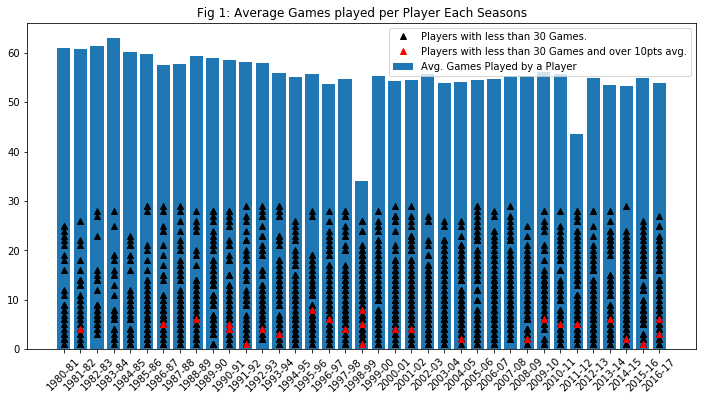

In [48]:
fig,ax_games = plt.subplots(1,1,figsize = (12,6))
ax_games.bar(seasonal_stats["Season"],seasonal_stats["Average Games"], label="Avg. Games Played by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_games.plot(lessminutes["Season"],lessminutes["G"],'k^', label = 'Players with less than 30 Games.')
ax_games.plot(outliers_perf["Season"],outliers_perf["G"],'r^', label = 'Players with less than 30 Games and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_games.set_xticklabels(labels, rotation = 45)
ax_games.set_title("Fig 1: Average Games played per Player Each Seasons")
ax_games.legend()
plt.show()

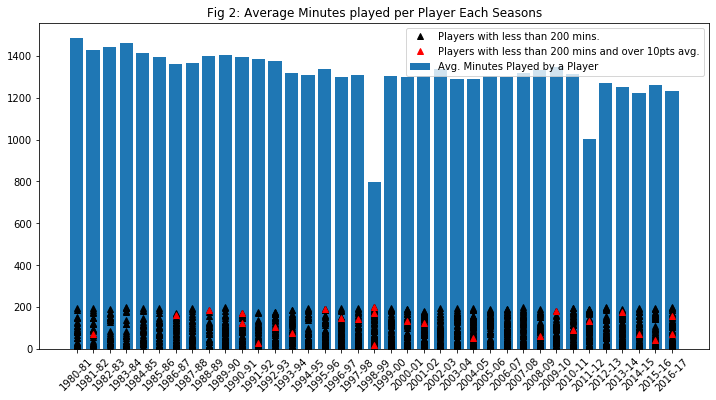

In [49]:
fig,ax_minutes = plt.subplots(1,1,figsize = (12,6))
ax_minutes.bar(seasonal_stats["Season"],seasonal_stats["Average Minutes"], label="Avg. Minutes Played by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_minutes.plot(lessminutes["Season"],lessminutes["Total Minutes"],'k^', label = 'Players with less than 200 mins.')
ax_minutes.plot(outliers_perf["Season"],outliers_perf["Total Minutes"],'r^', label = 'Players with less than 200 mins and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_minutes.set_xticklabels(labels, rotation = 45)
ax_minutes.set_title("Fig 2: Average Minutes played per Player Each Seasons")
ax_minutes.legend()
plt.show()


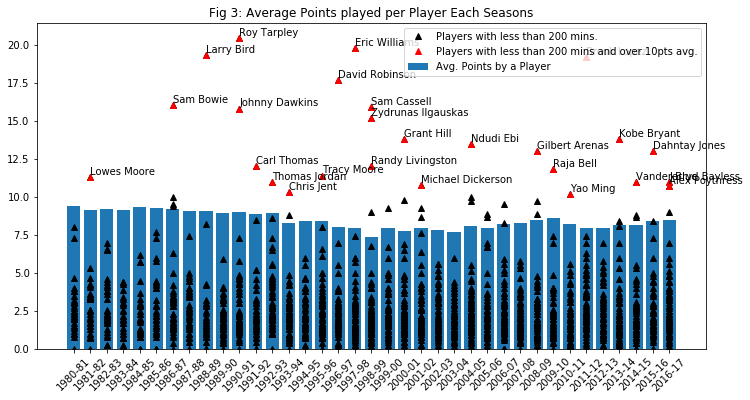

In [50]:
fig,ax_points = plt.subplots(1,1,figsize = (12,6))
ax_points.bar(seasonal_stats["Season"],seasonal_stats["Average Points"], label="Avg. Points by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_points.plot(lessminutes["Season"],lessminutes["PTS"],'k^', label = 'Players with less than 200 mins.')
ax_points.plot(outliers_perf["Season"],outliers_perf["PTS"],'r^', label = 'Players with less than 200 mins and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_points.set_xticklabels(labels, rotation = 45)
for (x,y,z) in zip(outliers_perf["Season"], outliers_perf["PTS"],outliers_perf["Name"]):
    ax_points.text(x = x, y = y + 0.15, s = z)
ax_points.set_title("Fig 3: Average Points played per Player Each Seasons")
ax_points.legend()
plt.show()

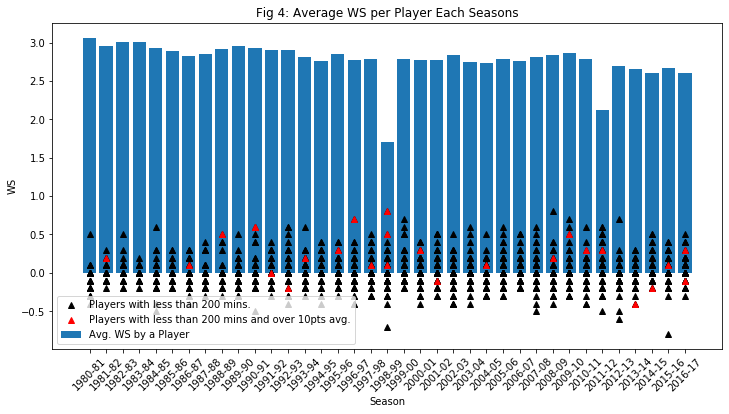

In [51]:
fig,ax_ws = plt.subplots(1,1,figsize = (12,6))
ax_ws.bar(seasonal_stats["Season"],seasonal_stats["Average WS"], label="Avg. WS by a Player")
#sns.barplot(x = "Season", y = "Average Games",data = seasonal_stats,ax = ax_games)
ax_ws.plot(lessminutes["Season"],lessminutes["WS"],'k^', label = 'Players with less than 200 mins.')
ax_ws.plot(outliers_perf["Season"],outliers_perf["WS"],'r^', label = 'Players with less than 200 mins and over 10pts avg.')
#sns.swarmplot(x = "Season", y = "G", data = outliers,size = 10, ax = ax_games)
labels = seasonal_stats["Season"].unique().tolist()
ax_ws.set_xticklabels(labels, rotation = 45)
#for (x,y,z) in zip(outliers_perf["Season"], outliers_perf["WS"],outliers_perf["Name"]):
#    ax_ws.text(x = x, y = y + 0.15, s = z)
ax_ws.set_title("Fig 4: Average WS per Player Each Seasons")
ax_ws.set_xlabel("Season")
ax_ws.set_ylabel("WS")
ax_ws.legend()
plt.show()

In [52]:
#percentage of performing outliers in the total set of players having less than 200 mins a season
print("Percentage of players with less than 200 minutes and over 10PTS: {}".format((outliers_perf.shape[0]/nba_data_df.shape[0])*100))
print("Percentage of players with less than 200 minutes : {}".format((lessminutes.shape[0]/nba_data_df.shape[0])*100))

Percentage of players with less than 200 minutes and over 10PTS: 0.1707493268536153
Percentage of players with less than 200 minutes : 14.342943455703686


A Majority of the players with less than 200 minutes in total for a given season, shoot less than the league average. Only 0.2% of players shoot above the league average in such cases. These are anomalies, due to either:
- A player suffered an injury in the opening weeks of the season (E.g. Kobe Bryant, Stephen Curry, Yao Ming, Gilbert Arenas)
- A player who performed in one game and performed bad the rest of the games, hence was sidelined

Hence we remove these **performing** outliers.



In [53]:
idex_performingoutliers = outliers_perf.index.values.tolist()
cleaning_data_set = cleaning_data_set.drop(idex_performingoutliers).reset_index(drop = True)

We shall attempt to fill in the missing values of the columns. The following will show a visual representation of the missing values. 


In [54]:
def numberofnan(dataset):
    column_labels = dataset.columns.tolist()[1:-1]
    num_missingvalues = list()
    percentage_missingvalues = list()
    for column in column_labels:
        num_missingvalues.append(dataset[column].isna().sum())
        percentage_missingvalues.append(100*(dataset[column].isna().sum())/dataset[column].shape[0])
    missing_value_percentage_df = pd.DataFrame({'Column Name':column_labels,'Number of Missing values':num_missingvalues,'% of missing values':percentage_missingvalues})
    return missing_value_percentage_df

In [55]:
missing_data_df = numberofnan(cleaning_data_set)
display(missing_data_df.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


The above table tells us that the Web Scraping was a success, as the number of missing values is not overwhelming for a dataset that contains data since the 1980 NBA season.

<h3> Filling nan values of FT% </h3>

In [56]:
cleaning_data_set.loc[nba_data_df["FT%"].isna()].iloc[:,-15:].head(10)

,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
43,0.0,0.0,NaN,0.2,0.8,1.0,0.8,0.2,0.0,0.8,0.8,1.8,2005,-0.2,-0.230
107,0.0,0.0,NaN,0.0,0.5,0.5,0.3,0.3,0.0,1.0,1.0,3.8,2006,0.0,-0.015
123,0.0,0.0,NaN,0.0,0.5,0.5,0.3,0.0,0.0,1.3,1.0,2.5,Undrafted,-0.2,-0.315
145,0.0,0.0,NaN,0.0,0.3,0.3,0.3,0.0,0.0,0.0,1.0,1.7,Undrafted,0.0,0.196
173,0.0,0.0,NaN,0.3,0.5,0.8,0.0,0.1,0.3,0.1,0.1,1.3,Undrafted,0.0,0.052
266,0.0,0.0,NaN,0.5,0.5,1.0,0.0,0.5,0.5,1.0,2.0,1.0,Undrafted,0.0,-0.206
316,0.0,0.0,NaN,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,Undrafted,0.0,-0.104
380,0.0,0.0,NaN,0.1,1.0,1.2,0.6,0.5,0.2,0.3,0.6,1.8,1989,0.0,-0.011
426,0.0,0.0,NaN,0.2,0.5,0.7,0.0,0.3,0.0,0.0,0.2,0.0,2005,0.0,0.155
437,0.0,0.0,NaN,0.0,0.5,0.5,0.0,0.0,0.0,0.0,1.0,3.0,2014,0.0,0.291


A First glance at the above data shows that FT% is empty when FT and FTA are 0.0.

In [57]:
print("Total Free Throws: {}".format(cleaning_data_set.loc[cleaning_data_set["FT%"].isna()]["FT"].sum()))
print("Total Free Throws Attempts: {}".format(cleaning_data_set.loc[cleaning_data_set["FT%"].isna()]["FTA"].sum()))

Total Free Throws: 0.0
Total Free Throws Attempts: 0.0


As per the above analysis, there are no FTA in this data, hence the FT% is NaN. Hence we shall fill this with 0.0 too. 

In [58]:
#fill missing FT%
cleaning_data_set.loc[cleaning_data_set["FT%"].isna(),"FT%"] = 0.0
missing_data_df_ftpercent = numberofnan(cleaning_data_set)
display(missing_data_df_ftpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


<h3> Filling in 3P% </h3> 

In [59]:
cleaning_data_set.loc[cleaning_data_set["3P%"].isna()].iloc[:,-20:].head(10)

,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
0,NaN,1.3,2.7,0.474,0.474,0.6,1.0,0.568,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1990,0.5,0.079
1,NaN,2.5,5.1,0.493,0.493,1.1,1.4,0.752,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1990,2.1,0.110
3,NaN,1.8,4.2,0.436,0.436,1.2,1.9,0.640,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032
40,NaN,0.5,2.3,0.214,0.214,0.7,0.7,1.000,1.0,0.7,1.7,0.7,0.2,0.0,0.2,1.5,1.7,1996,0.0,-0.005
45,NaN,1.4,2.6,0.532,0.532,0.9,1.4,0.640,1.3,2.1,3.4,0.5,0.4,0.3,0.7,2.5,3.6,1985,2.2,0.090
56,NaN,6.1,11.6,0.526,0.526,2.7,3.5,0.768,2.1,5.2,7.3,4.6,1.4,0.9,3.0,3.0,14.9,1975,7.7,0.180
60,NaN,5.8,11.2,0.520,0.520,3.0,3.5,0.883,1.9,4.2,6.1,3.8,1.4,0.6,2.4,3.1,14.7,1975,6.8,0.152
65,NaN,0.3,1.1,0.308,0.308,0.3,0.5,0.500,0.1,0.5,0.6,0.1,0.1,0.1,0.3,0.3,0.9,2006,-0.2,-0.144
79,NaN,1.1,2.3,0.503,0.503,1.0,1.7,0.581,1.8,2.3,4.1,0.5,0.5,0.7,0.9,2.5,3.3,2013,2.9,0.114
81,NaN,3.3,5.3,0.613,0.613,1.4,2.5,0.582,2.7,3.9,6.7,0.8,0.5,1.1,1.1,2.8,8.0,2013,6.5,0.155


It looks to be the same case as with FT% where if 3P and 3PA are 0.0, 3P% is also empty.

In [60]:
print("Total 3 Pointers : {}".format(cleaning_data_set.loc[cleaning_data_set["3P%"].isna()]["3P"].sum()))
print("Total 3 Point Attemptd: {}".format(cleaning_data_set.loc[cleaning_data_set["3P%"].isna()]["3PA"].sum()))

Total 3 Pointers : 0.0
Total 3 Point Attemptd: 0.0


As expected, the 3P and 3PA are all zero, hence 3P% too can be made to be 0.0. 

In [61]:
#fill missing 3P%
cleaning_data_set.loc[cleaning_data_set["3P%"].isna(),"3P%"] = 0.0
missing_data_df_3ppercent = numberofnan(cleaning_data_set)
display(missing_data_df_3ppercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


<h3> Dealing with missing FG% </h3>

In [62]:
cleaning_data_set.loc[cleaning_data_set["FG%"].isna()].iloc[:,-25:].head(20)

,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,...,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
766,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1990,0.0,0.424
1055,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,1.5,0.0,0.0,0.0,0.5,0.0,0.0,Undrafted,0.0,-0.215
1347,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted,0.0,-0.017
1447,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Undrafted,0.0,0.321
2123,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted,0.0,-0.022
2259,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,Undrafted,0.0,0.029
2507,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.8,0.5,0.3,0.0,0.3,0.3,0.0,2004,0.0,-0.003
2739,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.5,0.0,0.0,1.5,1.0,1982,0.0,0.440
3041,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2007,0.0,0.000
3395,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.3,0.0,0.3,0.0,0.0,0.0,0.0,2015,0.0,0.116


In [63]:
print("Total Field Goals : {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["FG"].sum()))
print("Total Field Goals Attempts: {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["FGA"].sum()))
print("Total 2 Pointers : {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["2P"].sum()))
print("Total 2 Point Attempts: {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["2PA"].sum()))
print("Total 3 Pointers  : {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["3P"].sum()))
print("Total 3 Point Attempts: {}".format(cleaning_data_set.loc[cleaning_data_set["FG%"].isna()]["3PA"].sum()))

Total Field Goals : 0.0
Total Field Goals Attempts: 0.0
Total 2 Pointers : 0.0
Total 2 Point Attempts: 0.0
Total 3 Pointers  : 0.0
Total 3 Point Attempts: 0.0


Players with no FG% are players who have not attempted any 2 Pointers or 3 Pointers. Hence tthe FG% can also be filled with 0. 

In [64]:
#fill missing FG%
cleaning_data_set.loc[cleaning_data_set["FG%"].isna(),"FG%"] = 0.0
missing_data_df_fgpercent = numberofnan(cleaning_data_set)
display(missing_data_df_fgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


<h3> Filling in 2P%</h3>

In [65]:
cleaning_data_set.loc[cleaning_data_set["2P%"].isna()].iloc[:,-20:].head(20)

,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
766,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1990,0.0,0.424
1055,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.5,1.0,1.5,0.0,0.0,0.0,0.5,0.0,0.0,Undrafted,0.0,-0.215
1316,0.500,0.0,0.0,NaN,0.750,0.5,0.5,1.0,0.0,0.5,0.5,0.5,0.2,0.0,0.2,0.3,2.0,2003,0.1,0.121
1347,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted,0.0,-0.017
1447,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Undrafted,0.0,0.321
2123,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Undrafted,0.0,-0.022
2259,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,Undrafted,0.0,0.029
2507,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.8,0.8,0.5,0.3,0.0,0.3,0.3,0.0,2004,0.0,-0.003
2739,0.000,0.0,0.0,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,1.5,1.0,1982,0.0,0.440
3041,0.000,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2007,0.0,0.000


In [66]:
print("Total 2 Pointers : {}".format(cleaning_data_set.loc[cleaning_data_set["2P%"].isna()]["2P"].sum()))
print("Total 2 Point Attempts: {}".format(cleaning_data_set.loc[cleaning_data_set["2P%"].isna()]["2PA"].sum()))

Total 2 Pointers : 0.0
Total 2 Point Attempts: 0.0


In [67]:
#fill missing 2P%
cleaning_data_set.loc[cleaning_data_set["2P%"].isna(),"2P%"] = 0.0
missing_data_df_2ppercent = numberofnan(cleaning_data_set)
display(missing_data_df_2ppercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


<h3> Filling in eFG% </h3> 

eFG% is a statistic which adjusts for the fact that a 3 Point Field goal is more worth than a 2 Point Field goal. 

Its equation is (FG + 0.5*3P)/FGA

In [68]:
cleaning_data_set.loc[cleaning_data_set["eFG%"].isna(),"eFG%"] = 0.0
missing_data_df_efgpercent = numberofnan(cleaning_data_set)
display(missing_data_df_efgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


In [69]:
cleaning_data_set.loc[cleaning_data_set["GS"].isna()]["Season"].value_counts()

1980-81    275
Name: Season, dtype: int64

It seems that in the 1980-81 season, the Games Started(GS) statistic was not found. To fill this, we can try to find a correlation between the Points Scored and Games Started from other seasons. 

In [70]:
eighty81season = cleaning_data_set.loc[(cleaning_data_set["Season"] == "1980-81") & (~cleaning_data_set["GS"].isna())]
eighty81season

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,TRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
481,102,Tiny Archibald,1980-81,32.0,BOS,NBA,PG,80.0,72.0,35.3,...,2.2,7.7,0.9,0.2,3.3,2.5,13.8,1970,6.9,0.118
1175,239,Larry Bird,1980-81,24.0,BOS,NBA,PF,82.0,82.0,39.5,...,10.9,5.5,2.0,0.8,3.5,2.9,21.2,1978,10.8,0.160
2237,467,ML Carr,1980-81,30.0,BOS,NBA,SF,41.0,7.0,16.0,...,2.0,1.4,0.7,0.4,1.1,1.8,6.0,1973,1.1,0.082
2473,507,Maurice Cheeks,1980-81,24.0,PHI,NBA,PG,81.0,81.0,29.8,...,3.0,6.9,2.4,0.5,2.1,2.9,9.4,1978,8.5,0.169
2644,553,Doug Collins,1980-81,29.0,PHI,NBA,SG,12.0,12.0,27.4,...,2.4,3.5,0.6,0.3,1.8,1.9,12.3,1973,0.7,0.105
2997,632,Earl Cureton,1980-81,23.0,PHI,NBA,C,52.0,6.0,10.2,...,3.0,0.5,0.4,0.4,0.6,1.3,4.2,1979,1.2,0.109
3326,685,Darryl Dawkins,1980-81,24.0,PHI,NBA,C,76.0,76.0,27.5,...,7.2,1.4,0.5,1.5,2.9,4.2,14.0,1975,6.3,0.145
3733,773,Terry Duerod,1980-81,24.0,TOT,NBA,"SF,SG",50.0,0.0,9.0,...,0.9,0.7,0.3,0.1,0.7,0.5,4.9,1979,0.2,0.018
4114,847,Julius Erving,1980-81,30.0,PHI,NBA,SF,82.0,82.0,35.0,...,8.0,4.4,2.1,1.8,3.2,2.8,24.6,1972,13.8,0.231
4264,885,Eric Fernsten,1980-81,27.0,BOS,NBA,C,45.0,0.0,6.2,...,1.4,0.2,0.1,0.2,0.4,0.6,2.1,1975,0.5,0.079


In [71]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
col_list = eighty81season.columns.tolist()
col_list.remove('PlayerID')
col_list.remove('Season')
col_list.remove('Name')
col_list.remove('Lg')
col_list.remove('Tm')
col_list.remove('Draft Year')
col_list.remove('FG%')
col_list.remove('3P%')
col_list.remove('2P%')
col_list.remove('eFG%')
col_list.remove('FT%')
#investigate which features are the best
workingsetGS = eighty81season[col_list]
GSvals = workingsetGS["GS"]
col_list.remove("GS")
featureset = workingsetGS[col_list]
#GSvals = eighty81season["GS"]







In [72]:
featureset.loc[(featureset["Pos"] == "SF,SG"),"Pos"] = "SG"
featureset

,Age,Pos,G,MP,FG,FGA,3P,3PA,2P,2PA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,WS,WS/48
481,32.0,PG,80.0,35.3,4.8,9.6,0.0,0.1,4.8,9.5,...,1.8,2.2,7.7,0.9,0.2,3.3,2.5,13.8,6.9,0.118
1175,24.0,PF,82.0,39.5,8.8,18.3,0.2,0.9,8.5,17.4,...,8.6,10.9,5.5,2.0,0.8,3.5,2.9,21.2,10.8,0.160
2237,30.0,SF,41.0,16.0,2.4,5.3,0.0,0.3,2.3,4.9,...,1.4,2.0,1.4,0.7,0.4,1.1,1.8,6.0,1.1,0.082
2473,24.0,PG,81.0,29.8,3.8,7.2,0.0,0.1,3.8,7.1,...,2.2,3.0,6.9,2.4,0.5,2.1,2.9,9.4,8.5,0.169
2644,29.0,SG,12.0,27.4,5.2,10.5,0.0,0.0,5.2,10.5,...,1.9,2.4,3.5,0.6,0.3,1.8,1.9,12.3,0.7,0.105
2997,23.0,C,52.0,10.2,1.8,3.9,0.0,0.0,1.8,3.9,...,2.0,3.0,0.5,0.4,0.4,0.6,1.3,4.2,1.2,0.109
3326,24.0,C,76.0,27.5,5.6,9.2,0.0,0.0,5.6,9.2,...,5.8,7.2,1.4,0.5,1.5,2.9,4.2,14.0,6.3,0.145
3733,24.0,SG,50.0,9.0,2.1,4.7,0.2,0.3,1.9,4.4,...,0.5,0.9,0.7,0.3,0.1,0.7,0.5,4.9,0.2,0.018
4114,30.0,SF,82.0,35.0,9.7,18.6,0.0,0.2,9.6,18.4,...,5.0,8.0,4.4,2.1,1.8,3.2,2.8,24.6,13.8,0.231
4264,27.0,C,45.0,6.2,0.8,1.8,0.0,0.0,0.8,1.8,...,0.7,1.4,0.2,0.1,0.2,0.4,0.6,2.1,0.5,0.079


In [73]:
from sklearn.base import TransformerMixin,BaseEstimator
from sklearn.preprocessing import StandardScaler
class separateattributes(BaseEstimator,TransformerMixin):
    def __init__(self,attributes):
        
        self.attributes = attributes
    def fit(self,X,y=None):
        return self
    def transform(self,X):
        return X[self.attributes]
        
class onehotencodeddataframe(BaseEstimator,TransformerMixin):
    def __init__(self,attributes):
        self.attributes = attributes
    def fit(self,X):
        return self
    def transform(self,X):
        for attrib in self.attributes:
            X = pd.get_dummies(X,columns = [attrib])
        return X
class scalerdataframe(BaseEstimator, TransformerMixin):
    def __init__(self):
        return None
    def fit(self,data):
        return self
    def transform(self,dataset):
        scl = StandardScaler()
        scaleddf = pd.DataFrame(scl.fit_transform(dataset.values),columns = dataset.columns, index = dataset.index)
        return scaleddf

In [74]:
cat_attribs = ["Pos"]
num_attribs = featureset.columns.tolist()
num_attribs.remove("Pos")

In [75]:
from sklearn.pipeline import Pipeline
num_pipeline = Pipeline([
    ('get_num_attribs',separateattributes(num_attribs)),
    ('scale_num_data', scalerdataframe()),
    ])
cat_pipeline = Pipeline([
    ('get_cat_attribs',separateattributes(cat_attribs)),
    ('encode_cat_data',onehotencodeddataframe(cat_attribs)),
])

In [76]:
num_features = num_pipeline.fit_transform(featureset)
cat_features = cat_pipeline.fit_transform(featureset)

In [77]:
final_eighty81season = pd.concat([num_features,cat_features],axis = 1)
final_eighty81season.head()

,Age,G,MP,FG,FGA,3P,3PA,2P,2PA,FT,...,TOV,PF,PTS,WS,WS/48,Pos_C,Pos_PF,Pos_PG,Pos_SF,Pos_SG
481,1.682746,0.567517,1.220706,0.264707,0.289467,-0.415581,-0.286299,0.291548,0.318830,1.689108,...,1.562761,0.164722,0.575950,0.547536,0.142191,0,0,1,0,0
1175,-0.806021,0.665059,1.646341,2.016149,2.341467,1.616150,2.233134,1.928235,2.216522,1.089747,...,1.781051,0.567376,1.865698,1.520177,0.649465,0,1,0,0,0
2237,1.060554,-1.334552,-0.735188,-0.786159,-0.724740,-0.415581,0.343559,-0.814322,-0.786156,-0.558496,...,-0.838434,-0.539923,-0.783514,-0.898956,-0.292616,0,0,0,1,0
2473,-0.806021,0.616288,0.663327,-0.173154,-0.276602,-0.415581,-0.286299,-0.150800,-0.257684,-0.258815,...,0.253018,0.567376,-0.190927,0.946568,0.758166,0,0,1,0,0
2644,0.749458,-2.748912,0.420107,0.439851,0.501743,-0.415581,-0.601228,0.468487,0.559044,-0.034055,...,-0.074417,-0.439259,0.314515,-0.998714,-0.014823,0,0,0,0,1


Using a simple RandomForest Regressor to train the data to predict the number of games started. As this is only to fill some missing values, we arent very concerned with accuracy

In [78]:
from sklearn.ensemble import RandomForestRegressor
rand_regressor = RandomForestRegressor(n_estimators = 500, criterion= 'mse',max_depth = 10, max_leaf_nodes=16, bootstrap= True,max_samples = 0.9)

In [79]:
rand_regressor.fit(final_eighty81season,GSvals)

RandomForestRegressor(max_depth=10, max_leaf_nodes=16, max_samples=0.9,
                      n_estimators=500)

In [80]:
for (attrib,imp) in zip(final_eighty81season.columns.tolist(),rand_regressor.feature_importances_):
    print('{}:{}'.format(attrib,imp))

Age:0.003231045990643171
G:0.003819809211696888
MP:0.5761855158823223
FG:0.011642733307806515
FGA:0.023673521406862918
3P:0.002783687077726964
3PA:0.004550427597869256
2P:0.0018824184909301566
2PA:0.005997348566009886
FT:0.009654359301930157
FTA:0.010321242881214852
ORB:0.002348018655521233
DRB:0.0006637904105801246
TRB:0.0031895286492520745
AST:0.003953298270387252
STL:0.00657460273906627
BLK:0.0035217682475279584
TOV:0.09936322600630591
PF:0.14427807101861884
PTS:0.021217975627168015
WS:0.05481810910072287
WS/48:0.005521574818493359
Pos_C:0.00015483001007614847
Pos_PF:2.0693367260710193e-06
Pos_PG:0.00029792002235221423
Pos_SF:2.4443141905204014e-05
Pos_SG:0.00032866423028345083


In [81]:
gs_pred = rand_regressor.predict(final_eighty81season)
np.ceil(gs_pred)

array([65., 81.,  6., 73., 28.,  5., 67.,  3., 81.,  2., 61., 12., 27.,
       74.,  2., 81., 16., 10., 75.,  3., 10., 45.])

It is not very accurate, however we can still use this to fill in some missing values.

In [82]:
cleaning_data_set.loc[cleaning_data_set["eFG%"].isna(),"eFG%"] = 0.0
missing_data_df_efgpercent = numberofnan(cleaning_data_set)
display(missing_data_df_efgpercent.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,275,1.83199
8,MP,0,0
9,FG,0,0


In [83]:
cleaning_data_set.loc[cleaning_data_set["GS"].isna()]
num_features_pred = num_pipeline.fit_transform(cleaning_data_set.loc[cleaning_data_set["GS"].isna()])
cat_features_pred = cat_pipeline.fit_transform(cleaning_data_set.loc[cleaning_data_set["GS"].isna()])

In [84]:
final_eighty81season_pred = pd.concat([num_features_pred,cat_features_pred],axis = 1)
final_eighty81season_pred.head()

,Age,G,MP,FG,FGA,3P,3PA,2P,2PA,FT,...,TOV,PF,PTS,WS,WS/48,Pos_C,Pos_PF,Pos_PG,Pos_SF,Pos_SG
5,2.243374,0.777317,1.656045,2.824570,2.233960,-0.317051,-0.485643,2.857475,2.310526,2.470462,...,1.727210,0.821366,2.790879,3.871077,1.898326,1,0,0,0,0
41,0.047901,-0.856281,-1.483267,-1.295604,-1.356151,-0.317051,-0.485643,-1.284510,-1.338154,-1.131749,...,-1.738945,-1.511622,-1.281837,-0.861601,-0.013490,0,0,0,1,0
56,0.047901,0.578098,0.616678,0.993382,0.815114,-0.317051,-0.485643,1.016593,0.868533,0.597312,...,1.607687,0.715321,0.920078,1.623906,1.329333,1,0,0,0,0
248,-1.206654,-1.533626,-0.963584,-1.129132,-1.033686,-0.317051,-0.485643,-1.117157,-1.010428,-0.915617,...,-0.782764,-0.026993,-1.099723,-1.099938,-1.333554,0,1,0,0,0
641,1.929735,-0.537530,-0.921160,-1.170750,-1.248663,-0.317051,-0.485643,-1.158995,-1.228912,-1.131749,...,-1.141332,-0.557218,-1.182502,-0.793505,-0.184188,1,0,0,0,0


In [85]:
missing_GS_vals = np.ceil(rand_regressor.predict(final_eighty81season_pred))
missing_GS_vals

array([79.,  2., 78.,  5.,  3., 79., 64., 78.,  7., 76.,  9., 69.,  4.,
       25.,  7., 33., 61.,  6.,  9., 70., 30.,  4., 78., 42.,  4.,  5.,
       76., 77.,  6., 11.,  8.,  3.,  2., 80.,  6.,  3., 80., 25.,  4.,
       76.,  3., 42., 34., 69., 74., 16., 34., 53.,  4., 15., 22., 73.,
       68.,  4.,  5., 67.,  3.,  7.,  6.,  2., 18., 78., 21., 22., 28.,
        6.,  4., 79., 10.,  7., 81.,  5.,  2., 74.,  7.,  8., 16.,  4.,
       76., 79., 11., 62., 10., 60., 80., 66., 27., 72., 37., 12.,  3.,
        8.,  3., 14.,  4.,  7., 78., 79., 15., 14., 64., 39., 37., 30.,
        3., 31., 79.,  5., 61., 74.,  5.,  9., 17., 80., 68., 31., 39.,
       62.,  3., 78., 78., 70.,  4., 31., 70., 51., 11., 22.,  3., 16.,
        3.,  5., 17., 38., 67., 67.,  3., 80., 80., 68.,  5., 12., 38.,
       76., 70., 69.,  3.,  5., 74.,  4., 23., 33.,  4., 69., 74., 57.,
       76., 47., 14., 12., 81., 72.,  7.,  2., 22.,  3.,  2.,  5., 72.,
       60.,  7.,  2., 29.,  4., 70., 34., 65., 19., 15., 67., 79

In [86]:
cleaning_data_set.loc[cleaning_data_set["GS"].isna(),"GS"] = missing_GS_vals

In [87]:
missing_data_df_gs = numberofnan(cleaning_data_set)
display(missing_data_df_gs.style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,0,0
8,MP,0,0
9,FG,0,0


In [88]:
#as the model trained to predict GS has in some cases predicted a GA value higher than the G value, we cap it at G - 2 in such cases
cleaning_data_set.loc[(cleaning_data_set["Season"] == "1980-81") & (cleaning_data_set["GS"] > cleaning_data_set["G"]), "GS"] = cleaning_data_set.loc[(cleaning_data_set["Season"] == "1980-81") & (cleaning_data_set["GS"] > cleaning_data_set["G"])]["G"] - 2


In [89]:
display(numberofnan(cleaning_data_set).style.background_gradient(cmap = 'Reds',axis = 0))

,Column Name,Number of Missing values,% of missing values
0,Name,0,0
1,Season,0,0
2,Age,0,0
3,Tm,0,0
4,Lg,0,0
5,Pos,0,0
6,G,0,0
7,GS,0,0
8,MP,0,0
9,FG,0,0


<h3> Now all the missing data has been filled </h3>

Another set of outliers arise when players who barely attempt any 3 Pointers, 2 Pointers or FG, manage to get their **few** attempts to go in, causing their 3P%, 2P%, FG% to be equal to 1.0. The following analysis intends to analyse this further. 

In [90]:
complete_df = cleaning_data_set.copy()

Analysis 3 Pointers

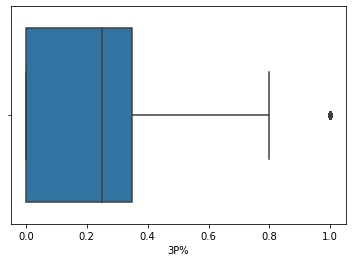

In [91]:
sns.boxplot(x = complete_df["3P%"])

In [92]:
#(75th percentile + 1.5*IQR
max_with_iqr = complete_df["3P%"].describe()["75%"] + 1.5*(complete_df["3P%"].describe()["75%"] - complete_df["3P%"].describe()["25%"])
max_with_iqr

0.8749999999999999

In [93]:
#players with 3P% greater than the maximum as per the above box plot
print("Average 3PA of players with  3P% greater than 0.88 : {}". format(complete_df[["3PA","3P%"]].loc[complete_df["3P%"] > max_with_iqr]["3PA"].mean()))
print("Average 3P% of players with  3P% greater than 0.88 : {}". format(complete_df[["3PA","3P%"]].loc[complete_df["3P%"] > max_with_iqr]["3P%"].mean()))
print("Average 3PA of entire NBA : {}".format(complete_df["3PA"].mean()))
print("Average 3P% of entire NBA : {}".format(complete_df["3P%"].mean()))

Average 3PA of players with  3P% greater than 0.88 : 0.09256198347107435
Average 3P% of players with  3P% greater than 0.88 : 1.0
Average 3PA of entire NBA : 1.1362400906002452
Average 3P% of entire NBA : 0.20770468323229704


From the above, the players who have a 3P% greater than the "Maximum" as per the boxplot, have less than average values when it comes to their 3PA. Hence this shows that 3P% is not a good statistic to rely on. In fact all % based features (3P%,2P%) tend to be misleading and are not advisable to be kept in data analysis as they are linearly dependent of other features.

Furthermore all FG,FGA,FG% and eFG% are linearly dependent of other variables. 

Hence these values will be dropped. 

In [94]:
complete_df_v2 = complete_df.drop(["3P%","2P%","FG%","FG","FGA","eFG%","FT%","TRB"],axis = 1)
complete_df_v2.head()

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,DRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,1.4,0.3,0.1,0.3,0.5,0.9,3.1,1990,0.5,0.079
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,2.5,0.4,0.4,0.2,0.9,1.9,6.1,1990,2.1,0.110
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,2.8,0.4,0.3,0.3,1.3,2.5,7.7,1990,2.0,0.074
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,2.6,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,1.4,0.2,0.3,0.2,0.8,1.9,4.7,1990,0.3,0.027


<h2> Predicting Player Improvement </h2> 

The ability to predict player improvement is a valuable asset as this can help a team looking to trade players. Given the change in a player's statistics of the past year, if they can predict the player's improvement the current year, they can decide whether to go ahead with a trade or not. 

The target variable selected will be the change in Win Shares(WS) as this metric shows the contribution of a player to the teams success, and a player with good improvement tends to have an increased WS. 

We can use the Most Improved Player award to prove the above hypothesis.

In [95]:
most_improved_player = pd.read_csv('Most_Improved_Player.csv')
most_improved_player.dropna(axis = 0, inplace = True)
most_improved_player.drop(most_improved_player[most_improved_player["Season"].apply(lambda x: int(x.split('-')[0])>=2017)].index.values.tolist(),axis = 0,inplace = True)
most_improved_player.rename(columns = {'Player':'Name'},inplace = True)
most_improved_player

most_improved_player["Name"] = most_improved_player["Name"].apply(lambda x: unidecode.unidecode(x))
most_improved_player

,Season,Lg,Name
3,2016-17,NBA,Giannis Antetokounmpo
4,2015-16,NBA,CJ McCollum
5,2014-15,NBA,Jimmy Butler
6,2013-14,NBA,Goran Dragic
7,2012-13,NBA,Paul George
8,2011-12,NBA,Ryan Anderson
9,2010-11,NBA,Kevin Love
10,2009-10,NBA,Aaron Brooks
11,2008-09,NBA,Danny Granger
12,2007-08,NBA,Hedo Turkoglu


In [96]:
most_improved_play_with_ws = pd.merge(most_improved_player, complete_df_v2, how = 'left', on = ["Name", "Season","Lg"])
most_improved_play_with_ws

,Season,Lg,Name,PlayerID,Age,Tm,Pos,G,GS,MP,...,DRB,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48
0,2016-17,NBA,Giannis Antetokounmpo,90,22.0,MIL,SF,80.0,80.0,35.6,...,7.0,5.4,1.6,1.9,2.9,3.1,22.9,2013,12.4,0.210
1,2015-16,NBA,CJ McCollum,1867,24.0,POR,SG,80.0,80.0,34.8,...,2.7,4.3,1.2,0.3,2.5,2.3,20.8,2013,6.0,0.104
2,2014-15,NBA,Jimmy Butler,428,25.0,CHI,SG,65.0,65.0,38.7,...,4.1,3.3,1.8,0.6,1.4,1.7,20.0,2011,11.2,0.214
3,2013-14,NBA,Goran Dragic,758,27.0,PHO,SG,76.0,75.0,35.1,...,2.3,5.9,1.4,0.3,2.8,2.7,20.3,2008,10.3,0.186
4,2012-13,NBA,Paul George,993,22.0,IND,SF,79.0,79.0,37.6,...,6.5,4.1,1.8,0.6,2.9,2.9,17.4,2010,9.0,0.145
5,2011-12,NBA,Ryan Anderson,83,23.0,ORL,PF,61.0,61.0,32.2,...,4.0,0.9,0.8,0.4,0.9,2.4,16.1,2008,8.9,0.219
6,2010-11,NBA,Kevin Love,1742,22.0,MIN,PF,73.0,73.0,35.8,...,10.7,2.5,0.6,0.4,2.1,2.0,20.2,2008,11.4,0.210
7,2009-10,NBA,Aaron Brooks,352,25.0,HOU,PG,82.0,82.0,35.6,...,2.0,5.3,0.8,0.2,2.8,2.4,19.6,2007,5.5,0.091
8,2008-09,NBA,Danny Granger,1049,25.0,IND,SF,67.0,66.0,36.2,...,4.4,2.7,1.0,1.4,2.5,3.1,25.8,2005,8.0,0.158
9,2007-08,NBA,Hedo Turkoglu,2867,28.0,ORL,SF,82.0,82.0,36.9,...,4.7,5.0,0.9,0.3,3.0,3.0,19.5,2000,9.0,0.143


In [97]:
complete_df_v2["MIP"] = np.nan
for (season,player) in zip(most_improved_play_with_ws["Season"],most_improved_play_with_ws["Name"]):
    complete_df_v2.loc[(complete_df_v2["Season"] == season) & (complete_df_v2["Name"] == player),"MIP"] = int(1)
complete_df_v2.loc[complete_df_v2["MIP"] != int(1),"MIP"] = int(0)

In [98]:
complete_df_v2["MIP"] = complete_df_v2["MIP"].astype(int)

In [99]:
complete_df_v2

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,AST,STL,BLK,TOV,PF,PTS,Draft Year,WS,WS/48,MIP
0,1,Alaa Abdelnaby,1990-91,22.0,POR,NBA,PF,43.0,0.0,6.7,...,0.3,0.1,0.3,0.5,0.9,3.1,1990,0.5,0.079,0
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,0.4,0.4,0.2,0.9,1.9,6.1,1990,2.1,0.110,0
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,0.4,0.3,0.3,1.3,2.5,7.7,1990,2.0,0.074,0
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.2,0.2,0.2,1.3,1.5,4.9,1990,-0.1,-0.032,0
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,0.2,0.3,0.2,0.8,1.9,4.7,1990,0.3,0.027,0
5,2,Kareem Abdul-Jabbar,1980-81,33.0,LAL,NBA,C,80.0,79.0,37.2,...,3.4,0.7,2.9,3.1,3.1,26.2,1969,14.3,0.230,0
6,2,Kareem Abdul-Jabbar,1981-82,34.0,LAL,NBA,C,76.0,76.0,35.2,...,3.0,0.8,2.7,3.0,2.9,23.9,1969,10.7,0.192,0
7,2,Kareem Abdul-Jabbar,1982-83,35.0,LAL,NBA,C,79.0,79.0,32.3,...,2.5,0.8,2.2,2.5,2.8,21.8,1969,10.9,0.205,0
8,2,Kareem Abdul-Jabbar,1983-84,36.0,LAL,NBA,C,80.0,80.0,32.8,...,2.6,0.7,1.8,2.8,2.6,21.5,1969,8.9,0.163,0
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,3.2,0.8,2.1,2.5,3.0,22.0,1969,11.2,0.204,0


In [100]:
delta_groups = complete_df_v2.groupby("Name")
delta_key_list = list()

for key,groups in delta_groups:
    delta_key_list.append(key)

delta_features = ["3P","3PA","2P","2PA","FT","FTA","ORB","DRB","AST","STL","BLK","TOV","PF","PTS","WS"]
non_delta_features = [i for i in delta_groups.get_group(delta_key_list[0]).columns.tolist() if i not in delta_features]
non_delta_features.remove("MIP")

i = 0
season_change_df = None
for key in delta_key_list:
    temp = delta_groups.get_group(key)
    player_change = pd.concat([temp.iloc[1:][non_delta_features],temp[delta_features].diff().iloc[1:],temp.iloc[1:]["MIP"]],axis = 1)
    if i != 0:
        season_change_df = pd.concat([season_change_df,player_change],axis = 0)
    else:
        season_change_df = player_change
        i = 1

In [101]:
season_change_df.sort_values(by=["PlayerID","Season"],inplace = True)
season_change_df

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,WS,MIP
1,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,0.5,1.1,0.1,0.3,-0.1,0.4,1.0,3.0,1.6,0
2,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,0.6,0.3,0.0,-0.1,0.1,0.4,0.6,1.6,-0.1,0
3,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,-0.8,-0.2,-0.2,-0.1,-0.1,0.0,-1.0,-2.8,-2.1,0
4,1,Alaa Abdelnaby,1994-95,26.0,TOT,NBA,PF,54.0,0.0,9.4,...,-0.2,-1.2,0.0,0.1,0.0,-0.5,0.4,-0.2,0.4,0
6,2,Kareem Abdul-Jabbar,1981-82,34.0,LAL,NBA,C,76.0,76.0,35.2,...,-0.2,-1.4,-0.4,0.1,-0.2,-0.1,-0.2,-2.3,-3.6,0
7,2,Kareem Abdul-Jabbar,1982-83,35.0,LAL,NBA,C,79.0,79.0,32.3,...,-0.2,-1.0,-0.5,0.0,-0.5,-0.5,-0.1,-2.1,0.2,0
8,2,Kareem Abdul-Jabbar,1983-84,36.0,LAL,NBA,C,80.0,80.0,32.8,...,0.0,-0.2,0.1,-0.1,-0.4,0.3,-0.2,-0.3,-2.0,0
9,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,0.0,0.6,0.6,0.1,0.3,-0.3,0.4,0.5,2.3,0
10,2,Kareem Abdul-Jabbar,1985-86,38.0,LAL,NBA,C,79.0,79.0,33.3,...,-0.4,-1.4,0.3,0.0,-0.5,0.1,0.1,1.4,-0.4,0
11,2,Kareem Abdul-Jabbar,1986-87,39.0,LAL,NBA,C,78.0,78.0,31.3,...,0.2,0.4,-0.9,-0.2,-0.4,-0.2,0.0,-5.9,-3.3,0


In [102]:
rank_groups = season_change_df.groupby('Season')
rank_groups_keys = list()

for key,group in rank_groups:
    rank_groups_keys.append(key)
i = 0
for key in rank_groups_keys:
    temp = rank_groups.get_group(key)
    temp["WS_Rank"] = temp["WS"].rank(ascending = True)
    temp.sort_values(by = "WS_Rank",inplace = True, ascending = False)
    if i==0:
        df_WS_rank = temp
        i = 1
    else:
        df_WS_rank = df_WS_rank.append(temp,ignore_index=True)
    
    



In [103]:
df_WS_rank.head(50)

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,DRB,AST,STL,BLK,TOV,PF,PTS,WS,MIP,WS_Rank
0,2899,Kiki Vandeweghe,1981-82,23.0,DEN,NBA,PF,82.0,78.0,33.8,...,0.2,1.2,0.0,-0.1,0.6,0.3,10.0,6.5,0,236.5
1,1471,Magic Johnson,1981-82,22.0,LAL,NBA,SG,78.0,77.0,38.3,...,0.5,0.9,-0.7,-0.3,-0.2,0.2,-3.0,6.5,0,236.5
2,2567,Lonnie Shelton,1981-82,26.0,SEA,NBA,PF,81.0,81.0,32.9,...,0.9,0.6,-0.4,0.3,-0.4,0.5,1.9,5.7,0,235.0
3,2672,Rory Sparrow,1981-82,23.0,ATL,NBA,PG,82.0,82.0,31.8,...,1.4,3.1,0.2,0.0,0.6,1.9,6.8,5.7,0,234.0
4,2074,Calvin Natt,1981-82,25.0,POR,NBA,SF,75.0,71.0,34.7,...,1.8,-0.1,-0.2,0.3,-0.3,-0.2,4.3,5.1,0,233.0
5,424,Don Buse,1981-82,31.0,IND,NBA,PG,82.0,78.0,30.8,...,1.1,2.6,0.7,0.2,0.5,1.0,4.6,5.1,0,231.5
6,3043,Jerome Whitehead,1981-82,25.0,SDC,NBA,C,72.0,63.0,30.8,...,2.7,0.9,0.3,0.4,0.8,1.5,9.8,5.1,0,231.5
7,3168,Mike Woodson,1981-82,23.0,TOT,NBA,SG,83.0,74.0,28.1,...,0.9,1.8,1.3,0.3,1.1,1.5,11.0,4.8,0,230.0
8,1770,Kyle Macy,1981-82,24.0,PHO,NBA,PG,82.0,72.0,34.7,...,1.1,2.7,0.8,0.0,0.3,0.8,6.1,4.7,0,229.0
9,2580,Jack Sikma,1981-82,26.0,SEA,NBA,C,82.0,82.0,37.2,...,1.8,0.4,0.2,0.2,0.1,-0.1,0.9,4.6,0,228.0


In [104]:
#finding the seasonal WS rank

grouped_seasonal = df_WS_rank.groupby('Season')
key_list_seasonal = list()

for key,group in grouped_seasonal:
    key_list_seasonal.append(key)
ws_highest_rank = list()
season_list = list()
for key in key_list_seasonal:
    temp = grouped_seasonal.get_group(key)
    #getting the maximum change in WS for each year
    ws_highest_rank.append(temp["WS_Rank"].max())
    season_list.append(key)
maximum_ws_seasonal = pd.DataFrame({"Season":season_list,"Highest WS Rank":ws_highest_rank})
maximum_ws_seasonal

,Season,Highest WS Rank
0,1981-82,236.5
1,1982-83,245.0
2,1983-84,250.0
3,1984-85,257.0
4,1985-86,258.0
5,1986-87,265.0
6,1987-88,268.0
7,1988-89,270.0
8,1989-90,294.0
9,1990-91,308.0


In [105]:
merge_maximimum_ws_with_MIP = pd.merge(maximum_ws_seasonal,df_WS_rank.loc[df_WS_rank["MIP"] == 1], how = 'left', on = 'Season' )
merge_maximimum_ws_with_MIP["Rank Difference"] = merge_maximimum_ws_with_MIP["Highest WS Rank"] - merge_maximimum_ws_with_MIP["WS_Rank"]
merge_maximimum_ws_with_MIP

,Season,Highest WS Rank,PlayerID,Name,Age,Tm,Lg,Pos,G,GS,...,AST,STL,BLK,TOV,PF,PTS,WS,MIP,WS_Rank,Rank Difference
0,1981-82,236.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1982-83,245.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1983-84,250.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1984-85,257.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1985-86,258.0,2420.0,Alvin Robertson,23.0,SAS,NBA,SG,82.0,82.0,...,2.0,2.1,0.2,1.0,0.9,7.8,5.5,1.0,258.0,0.0
5,1986-87,265.0,827.0,Dale Ellis,26.0,SEA,NBA,SG,82.0,76.0,...,2.4,0.7,0.3,2.4,2.2,17.8,7.7,1.0,264.0,1.0
6,1987-88,268.0,770.0,Kevin Duckworth,23.0,POR,NBA,C,78.0,50.0,...,0.4,0.1,0.1,1.1,0.6,10.4,4.4,1.0,261.0,7.0
7,1988-89,270.0,1467.0,Kevin Johnson,22.0,PHO,NBA,PG,81.0,81.0,...,6.7,0.4,0.0,2.2,0.9,11.2,8.2,1.0,270.0,0.0
8,1989-90,294.0,2546.0,Rony Seikaly,24.0,MIA,NBA,C,74.0,72.0,...,0.4,0.5,0.5,0.6,0.2,5.7,3.7,1.0,283.0,11.0
9,1990-91,308.0,2606.0,Scott Skiles,26.0,ORL,NBA,PG,79.0,66.0,...,3.6,0.6,0.0,1.9,0.6,9.5,5.0,1.0,302.5,5.5


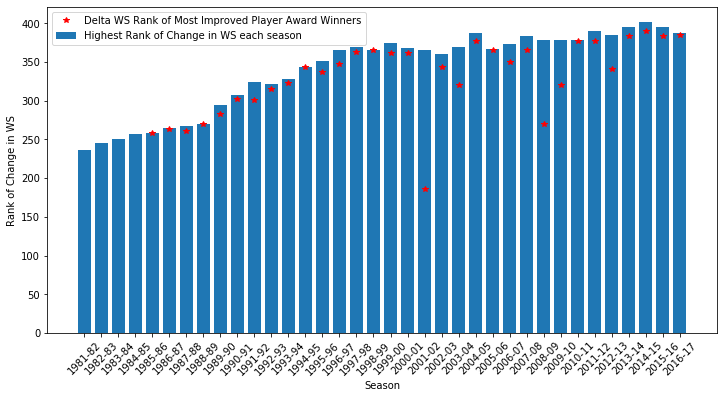

In [106]:
fig,ax_mip = plt.subplots(1,1,figsize = (12,6))
ax_mip.bar(maximum_ws_seasonal["Season"],maximum_ws_seasonal["Highest WS Rank"], label="Highest Rank of Change in WS each season")
ax_mip.plot(df_WS_rank.loc[df_WS_rank["MIP"] == 1]["Season"],df_WS_rank.loc[df_WS_rank["MIP"] == 1]["WS_Rank"],'r*', label = 'Delta WS Rank of Most Improved Player Award Winners')
labels = maximum_ws_seasonal["Season"].unique().tolist()
ax_mip.set_xticklabels(labels, rotation = 45)
'''
y_pos = {0:20,1:-20}
i = 0
for (x,y,z) in zip(df_WS_rank.loc[df_WS_rank["MIP"] == 1]["Season"], df_WS_rank.loc[df_WS_rank["MIP"] == 1]["WS_Rank"],df_WS_rank.loc[df_WS_rank["MIP"] == 1]["Name"]):
    ax_mip.text(x = x, y = y + y_pos[i%2], s = z)
    i = i + 1
'''

#ax_mip.set_title("I per Player Each Seasons")
ax_mip.set_xlabel("Season")
ax_mip.set_ylabel("Rank of Change in WS")
ax_mip.legend()
plt.show()

From the above graphic, we see that the Most Improved Players for that given season tend to, in a majority of cases, be within the highest increase in WS metric for any given season. 

**Hence change in WS is a reasonable metric to estimate the improvement of a player**

<h2> Now our goal is to predict the change in WS of a given season given the change in other statistics (e.g. PTS, 3P etc.) of the prior season </h2>

In [107]:
#moving change in WS of each season to the prior season 
delta_groups_pre = season_change_df.groupby("Name")
delta_key_list = list()

for key,groups in delta_groups_pre:
    delta_key_list.append(key)
cols = delta_groups_pre.get_group(delta_key_list[0]).columns.tolist()
cols.remove('WS')
cols.remove('MIP')

i = 0
season_change_df_pre = None
for key in delta_key_list:
    temp = delta_groups_pre.get_group(key)
    player_change = pd.concat([temp.iloc[0:-1][cols].reset_index(drop = True),temp[["WS"]].iloc[1:].reset_index(drop = True)],axis = 1)
    if i != 0:
        season_change_df_pre = pd.concat([season_change_df_pre,player_change],axis = 0,ignore_index=True)
    else:
        season_change_df_pre = player_change
        i = 1

In [108]:
season_change_df_pre.sort_values(by=["PlayerID","Season"],inplace = True)
season_change_df_pre.reset_index(drop = True,inplace=True)
season_change_df_pre

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,WS
0,1,Alaa Abdelnaby,1991-92,23.0,POR,NBA,PF,71.0,1.0,13.2,...,0.4,0.5,1.1,0.1,0.3,-0.1,0.4,1.0,3.0,-0.1
1,1,Alaa Abdelnaby,1992-93,24.0,TOT,NBA,PF,75.0,52.0,17.5,...,0.1,0.6,0.3,0.0,-0.1,0.1,0.4,0.6,1.6,-2.1
2,1,Alaa Abdelnaby,1993-94,25.0,BOS,NBA,PF,13.0,0.0,12.2,...,0.4,-0.8,-0.2,-0.2,-0.1,-0.1,0.0,-1.0,-2.8,0.4
3,2,Kareem Abdul-Jabbar,1981-82,34.0,LAL,NBA,C,76.0,76.0,35.2,...,-1.1,-0.2,-1.4,-0.4,0.1,-0.2,-0.1,-0.2,-2.3,0.2
4,2,Kareem Abdul-Jabbar,1982-83,35.0,LAL,NBA,C,79.0,79.0,32.3,...,-1.1,-0.2,-1.0,-0.5,0.0,-0.5,-0.5,-0.1,-2.1,-2.0
5,2,Kareem Abdul-Jabbar,1983-84,36.0,LAL,NBA,C,80.0,80.0,32.8,...,0.2,0.0,-0.2,0.1,-0.1,-0.4,0.3,-0.2,-0.3,2.3
6,2,Kareem Abdul-Jabbar,1984-85,37.0,LAL,NBA,C,79.0,79.0,33.3,...,0.1,0.0,0.6,0.6,0.1,0.3,-0.3,0.4,0.5,-0.4
7,2,Kareem Abdul-Jabbar,1985-86,38.0,LAL,NBA,C,79.0,79.0,33.3,...,0.6,-0.4,-1.4,0.3,0.0,-0.5,0.1,0.1,1.4,-3.3
8,2,Kareem Abdul-Jabbar,1986-87,39.0,LAL,NBA,C,78.0,78.0,31.3,...,-1.2,0.2,0.4,-0.9,-0.2,-0.4,-0.2,0.0,-5.9,-2.2
9,2,Kareem Abdul-Jabbar,1987-88,40.0,LAL,NBA,C,80.0,80.0,28.9,...,-1.0,-0.4,-0.3,-0.9,0.0,0.0,-0.4,-0.4,-2.9,-2.4


In [110]:
writer = pd.ExcelWriter(r'C:\Users\ASUS\Desktop\Kaggle\NBA Data\SeasonChanges.xlsx',engine='xlsxwriter')


season_change_df.to_excel(writer,sheet_name='Season changes')
season_change_df_pre.to_excel(writer,sheet_name='Season changes_pre')

writer.save()

<h3> Given that we are trying to predict the change in WS for the next year using the prior years improvements/declines, **season_change_df_pre** is the dataset to be used as the WS value of the next years have been appended to that of the prior year statistics </h3>

In [111]:
season_change_df.loc[season_change_df["MIP"] == 1][delta_features].mean(axis = 0)

3P     0.362500
3PA    0.812500
2P     2.665625
2PA    4.956250
FT     1.781250
FTA    2.106250
ORB    0.462500
DRB    1.568750
AST    1.581250
STL    0.325000
BLK    0.128125
TOV    0.953125
PF     0.443750
PTS    8.187500
WS     4.456250
dtype: float64

<h3> Average year by year Statistical Change of a player who wasn't voted Most Improved Player </h3>

In [112]:
season_change_df.loc[season_change_df["MIP"] != 1][delta_features].mean()

3P     0.017823
3PA    0.049951
2P    -0.138541
2PA   -0.275151
FT    -0.068559
FTA   -0.099681
ORB   -0.056854
DRB   -0.049427
AST   -0.044463
STL   -0.022828
BLK   -0.022395
TOV   -0.056404
PF    -0.061426
PTS   -0.292590
WS    -0.106110
dtype: float64

There is an evident difference in the average seasonal change of statistics each year, between a player who was voted Most Improved Player and someone who wasnt. 

<h3> Visualizing the data using t-Stochastic Distributed Neighbor Embedding </h3>

Given the large number of dimensions in this dataset, it would be convenient to be able to visualize the large dataset and it's dimensions while preserving 

In [113]:
from sklearn.manifold import TSNE
delta_features = ["WS/48","3P","3PA","2P","2PA","FT","FTA","ORB","DRB","AST","STL","BLK","TOV","PF","PTS","WS"]
delta_features.insert(0,"Age")
data_to_fit = season_change_df[delta_features]
data_to_fit

tsne = TSNE(n_components = 2, random_state= 42)
X_reduced = tsne.fit_transform(data_to_fit)

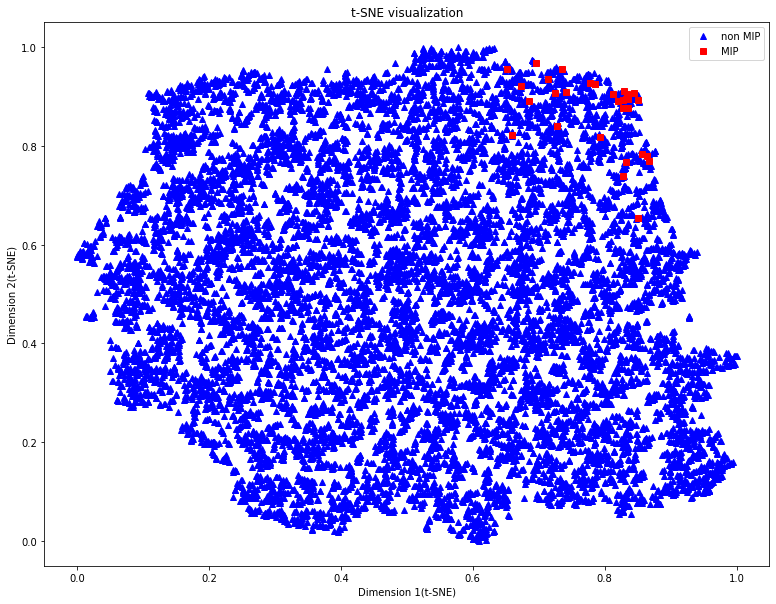

In [114]:

from sklearn.preprocessing import MinMaxScaler
X_normalized = MinMaxScaler().fit_transform(X_reduced)
fig,ax = plt.subplots(1,1,figsize = (13,10))
ax.plot(X_normalized[season_change_df["MIP"] == 0,0],X_normalized[season_change_df["MIP"] == 0,1],'b^', label = "non MIP")
ax.plot(X_normalized[season_change_df["MIP"] == 1,0],X_normalized[season_change_df["MIP"] == 1,1],'rs', label = "MIP")
ax.set_xlabel('Dimension 1(t-SNE)')
ax.set_ylabel('Dimension 2(t-SNE)')
ax.set_title('t-SNE visualization')
ax.legend()
plt.show()

The t-Stochastic Neighbor Embedding tries to reduce dimensionality while trying to keep similar instances close by and other dissimilar instances further apart. The above figure shows that all NBA players who won the Most Improved Player award tend to be isolated towards the top right of the figure. However there is still overlap with other players, which can affect the prediction algorithm.

In [115]:
xreduced_df = pd.DataFrame(data = X_normalized, columns = ["Dim1","Dim2"])
xreduced_df.to_csv('2DMIP.csv',index = False)

To prevent leakage of data from training set into test set, the dataset is separated into a train and test set prior to any data analysis. As the dataset has been prepared such that each instance is a improvement from the prior season, we can consider each instance to be independent data points. Hence we shall use a normal train_test_split module to separate the 2 datasets. 

In [116]:
features = season_change_df_pre.columns.tolist()
features.remove("WS")
X_data = season_change_df_pre[features]
y_data = season_change_df_pre[["WS"]]

In [117]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_data,y_data,test_size=0.1,random_state=42)

<h2> Investigating the impact of Age on Improvement in WS </h2> 

The hypothesis is that as a player ages, his ability to improve in skill will also decrease. Hence we expect the change in WS also decrease with increasing age. 

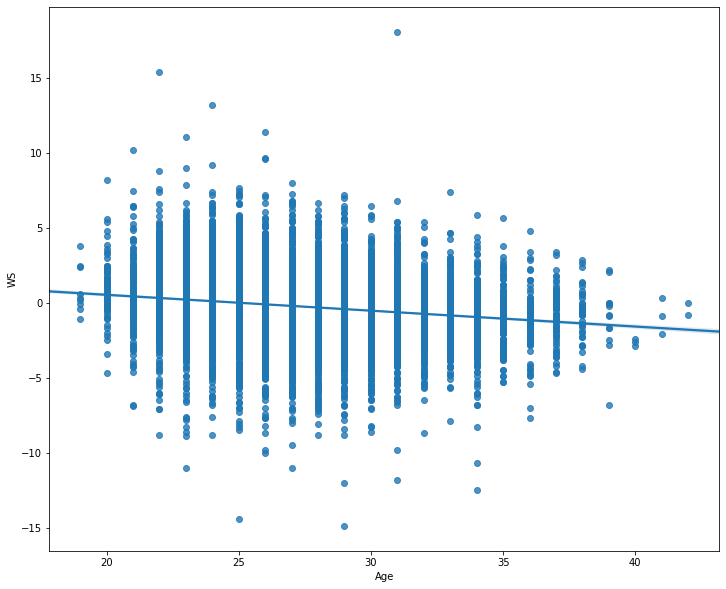

In [118]:
fig,ax_agereg = plt.subplots(1,1,figsize = (12,10))
sns_agereg = sns.regplot(x = X_train["Age"], y = y_train["WS"], ax = ax_agereg)


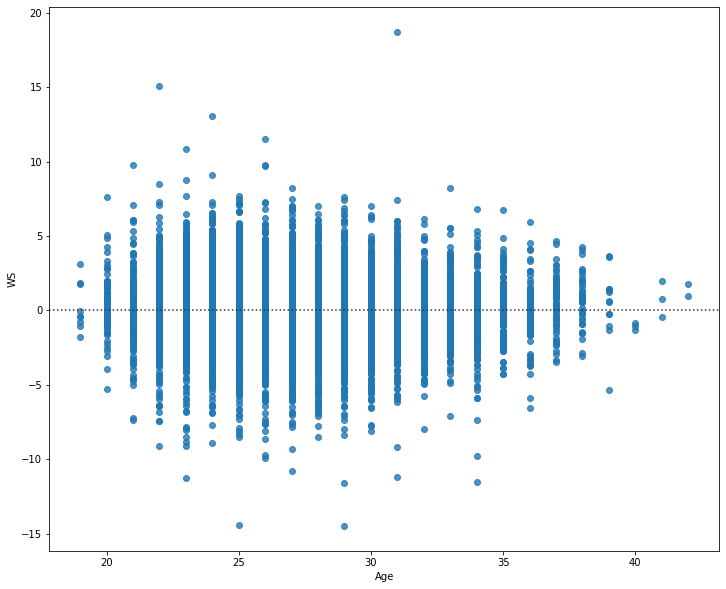

In [119]:
fig,ax_ageres = plt.subplots(1,1,figsize = (12,10))
sns_ageres = sns.residplot(x = X_train["Age"], y = y_train["WS"], ax = ax_ageres)


Age Groups are divided into 4 different groups:

- 1) Less than 25 years old
- 2) 25 to 30 years old
- 3) 30 to 35 years old
- 4) Greater than 35 years old


<h3> z-test between Age Group 1 and 2 </h3>

In [120]:
#
from scipy import stats
from statsmodels.stats import weightstats as stests
ztest,pval = stests.ztest(y_train.loc[X_train['Age'] < 25]["WS"],y_train.loc[(X_train['Age'] >=25) & (X_train['Age'] < 30)]["WS"],value = 0, alternative='two-sided')
pval

9.759053432844674e-20

<h3>z-test between Age Group 1 and 3</h3>

In [121]:
ztest,pval_2 = stests.ztest(y_train.loc[X_train['Age'] < 25]["WS"],y_train.loc[(X_train['Age'] >=30) & (X_train['Age'] < 35)]["WS"],value = 0, alternative='two-sided')
pval_2

2.4283041305373087e-51

<h3> z-test between Age Group 1 and 4 </h3>

In [122]:
ztest,pval_3 = stests.ztest(y_train.loc[X_train['Age'] < 25]["WS"],y_train.loc[(X_train['Age'] >=35)]["WS"],value = 0, alternative='two-sided')
pval_3

1.2758653574742716e-22

<h3> z-test between Age Group 2 and 3 </h3>

In [123]:
ztest,pval_4 = stests.ztest(y_train.loc[(X_train['Age'] >=25) & (X_train['Age'] < 30)]["WS"],y_train.loc[(X_train['Age'] >=30) & (X_train['Age'] < 35)]["WS"],value = 0, alternative='two-sided')
pval_4

3.989405707181034e-15

<h3> z-test between Age Group 2 and 4 </h3>

In [124]:
ztest,pval_5 = stests.ztest(y_train.loc[(X_train['Age'] >=25) & (X_train['Age'] < 30)]["WS"],y_train.loc[(X_train['Age'] >=35)]["WS"],value = 0, alternative='two-sided')
pval_5

1.3154804109718584e-08

<h3> z-test between Age Group 3 and 4 </h3>

In [125]:
ztest,pval_6 = stests.ztest(y_train.loc[(X_train['Age'] >=30) & (X_train['Age'] < 35)]["WS"],y_train.loc[(X_train['Age'] >=35)]["WS"],value = 0, alternative='two-sided')
pval_6

0.045433125923947146

In [126]:
#boxplot presentation
X_train_age = X_train.copy()
y_train_age = y_train.copy()
X_train_age.loc[X_train_age["Age"].apply(lambda x: x < 25),"Age Group"] = "<25"
X_train_age.loc[X_train_age["Age"].apply(lambda x: ((x >= 25) & (x < 30))),"Age Group"] = "25 to 30"
X_train_age.loc[X_train_age["Age"].apply(lambda x: ((x >= 30) & (x < 35))),"Age Group"] = "30 to 35"
X_train_age.loc[X_train_age["Age"].apply(lambda x: x >= 35),"Age Group"] = ">= 35"

X_train_age

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Age Group
1160,352,Aaron Brooks,2015-16,31.0,CHI,NBA,PG,69.0,0.0,16.1,...,-1.2,-0.1,-0.4,-0.6,-0.3,-0.1,-0.7,-0.4,-4.5,30 to 35
5197,1625,Toni Kukoc,2004-05,36.0,MIL,NBA,SF,53.0,6.0,20.7,...,-1.5,-0.2,-0.5,0.3,-0.1,-0.1,-0.3,-0.2,-2.8,>= 35
5940,1866,George McCloud,1996-97,29.0,TOT,NBA,SF,64.0,28.0,23.3,...,-1.2,-0.9,-1.1,-1.0,-0.4,-0.4,-1.1,-0.7,-8.6,25 to 30
3815,1170,Othella Harrington,2005-06,32.0,CHI,NBA,C,72.0,23.0,11.4,...,-0.8,-0.7,-1.3,-0.3,-0.2,-0.1,-0.4,-0.9,-3.2,30 to 35
10131,3207,Tyler Zeller,2013-14,24.0,CLE,NBA,C,70.0,9.0,15.0,...,-0.3,-0.6,-1.0,-0.7,-0.2,-0.4,-0.3,-1.3,-2.2,<25
1783,544,John Coker,1998-99,27.0,WAS,NBA,C,14.0,0.0,7.0,...,0.4,0.1,1.1,-0.2,0.1,-0.1,0.1,1.0,0.6,25 to 30
5143,1609,Bart Kofoed,1990-91,26.0,GSW,NBA,SG,5.0,0.0,4.2,...,0.6,0.2,-0.2,-0.3,-0.5,0.0,-0.3,-0.4,-1.0,25 to 30
6194,1949,Anthony Miller,1999-00,28.0,HOU,NBA,PF,35.0,14.0,13.6,...,0.7,0.5,1.9,0.3,0.1,0.1,0.2,0.7,1.3,25 to 30
9026,2837,Tom Tolbert,1992-93,27.0,ORL,NBA,PF,72.0,61.0,25.5,...,1.2,1.4,2.7,0.7,0.2,0.1,1.1,0.6,5.5,25 to 30
2425,732,Vlade Divac,1993-94,25.0,LAL,NBA,C,79.0,73.0,34.0,...,-0.4,0.9,1.0,1.1,-0.4,-0.3,-0.2,-0.2,1.4,25 to 30


Text(0.5, 1.0, 'Age vs. Most Improved Player Award')

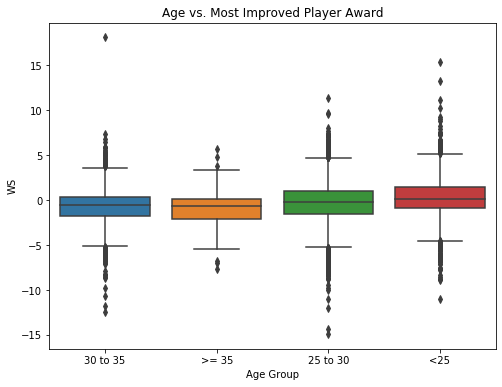

In [127]:
age_dataset = pd.concat([X_train_age, y_train_age], axis = 1)

ax_agebox = plt.figure(figsize = (8,6)).add_subplot(111)
sns.boxplot(x = age_dataset["Age Group"], y = age_dataset["WS"], ax = ax_agebox)
ax_agebox.set_title("Age vs. Most Improved Player Award")



Correlation between Age and WS change

In [128]:
from scipy.stats import pearsonr

corr_coef_age,p_val_corr_age = pearsonr(X_train["Age"],y_train["WS"])
print('Correlation Coefficient : {}'.format(corr_coef_age))
print('Correlation Coefficient P Value : {}'.format(p_val_corr_age))

Correlation Coefficient : -0.17129060409543637
Correlation Coefficient P Value : 4.998293896506414e-61


All age groups have a significant difference between them with respect to the change in the WS metric. This is proven by the 2 sample z-tests carried out between each age group. 

All the p values of these z tests are less than 0.05, hence their mean values are significantly different from each other. Furthermore, as observed in the regression plot, as age increases, the change in WS continues to decrease, with players actually starting to perform worse each season with age. Hence our Hypothesis from earlier stands.

Furthermore the Pearson Correlation Coefficient shows a negative correlation as expected, with a p-value less than 0.05. This tells us that the correlation is statistically significant.

<h3> Investigating the impact of Minutes Played Per Game and the change in WS metric </h3> 

The hypothesis for this case is that as the number of Minutes Played increases, the ability of a player to improve decreases. Where as a player with less minutes this season, however given more minutes the next season, he will improve as his productivity increases as playing time increases. 

So in brief, we are expecting the WS to improve next season, if a player has less minutes this season, he is likely to improve more the next season. 

import numpy as np
fig,ax_mpreg = plt.subplots(1,1,figsize = (12,10))
sns_mpreg = sns.regplot(x = X_train["MP"], y = y_train["WS"], ax = ax_mpreg)

Text(0.5, 1.0, 'Residual Plot of MP vs deltaWS')

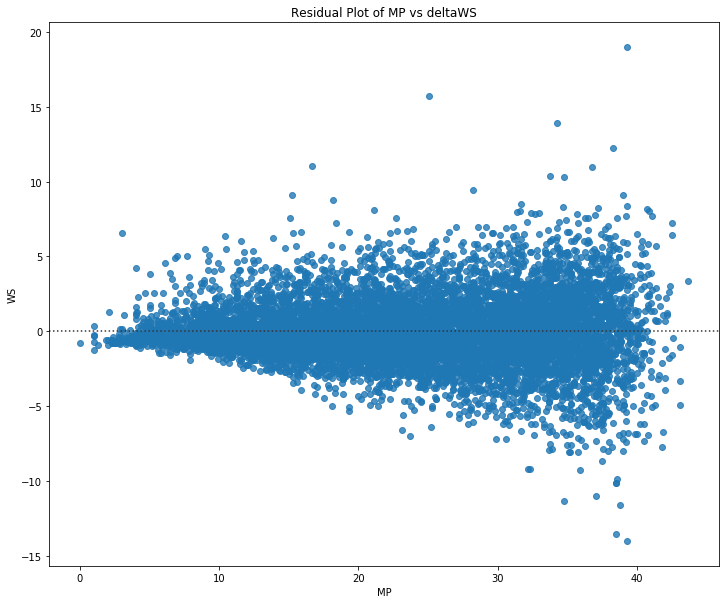

In [129]:
import numpy as np
fig,ax_mpres = plt.subplots(1,1,figsize = (12,10))
sns_mpres = sns.residplot(x = X_train["MP"], y = y_train["WS"], ax = ax_mpres)
ax_mpres.set_title('Residual Plot of MP vs deltaWS')

In [130]:
corr_coef_MP,p_val_corr_MP = pearsonr(X_train["MP"],y_train["WS"])
print('Correlation Coefficient : {}'.format(corr_coef_MP))
print('Correlation Coefficient P Value : {}'.format(p_val_corr_MP))

Correlation Coefficient : -0.17472433926650072
Correlation Coefficient P Value : 1.8373181791867123e-63


The hypothesis stands that as the number of minutes played increases, WS starts to decrease. However looking at both the Regression Plot and Residual plots, the difference between the predicted value and the actual value increasess with increasing value in MP. This suggests that the variable needs to be transformed before training the model. 

<h3> Investigating the effect of WS/48 on the year to year change in WS </h3>

WS/48 is the number of wins contributed by a player per 48 minutes played. Hence a higher value usually means that the player is a start player. 

A player who has a high WS/48 has less room for improvement. Furthermore it is also reasonable to say that players with high WS/48 values will have high Minutes Played, reducing there ability to have an year to year improvement in production causing their WS to increase. We saw this in the previous investigation of the impact of MP on WS. 

We shall analyse: 

- Whether players with high WS/48 do infact have high MP
- Divide players into different categories depending on the WS/48 value and check if their mean change in WS was statistically different. 


In [131]:
X_train["WS/48"].describe()

count    9124.000000
mean        0.090554
std         0.074105
min        -2.519000
25%         0.058000
50%         0.092000
75%         0.127000
max         2.123000
Name: WS/48, dtype: float64

Players will be grouped as follows:

- Less than 0.058 (Scrub Player)
- 0.058 - 0.092 (Rotational Players)
- 0.092 - 0.127 (Solid Players)
- Greater 0.127 (Star Players)

In [132]:
X_train_ws48 = X_train.copy()
y_train_ws48 = y_train.copy()

In [133]:
X_train_ws48.loc[X_train["WS/48"].apply(lambda x: x<= 0.058), 'Player Skill'] = "Scrub"
X_train_ws48.loc[X_train["WS/48"].apply(lambda x: ((x>0.058) & (x<= 0.092))), 'Player Skill'] = "Rotational"
X_train_ws48.loc[X_train["WS/48"].apply(lambda x: ((x>0.092) & (x<= 0.127))), 'Player Skill'] = "Solid"
X_train_ws48.loc[X_train["WS/48"].apply(lambda x: x> 0.127), 'Player Skill'] = "Star"

In [134]:
X_train_ws48

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Player Skill
1160,352,Aaron Brooks,2015-16,31.0,CHI,NBA,PG,69.0,0.0,16.1,...,-1.2,-0.1,-0.4,-0.6,-0.3,-0.1,-0.7,-0.4,-4.5,Scrub
5197,1625,Toni Kukoc,2004-05,36.0,MIL,NBA,SF,53.0,6.0,20.7,...,-1.5,-0.2,-0.5,0.3,-0.1,-0.1,-0.3,-0.2,-2.8,Rotational
5940,1866,George McCloud,1996-97,29.0,TOT,NBA,SF,64.0,28.0,23.3,...,-1.2,-0.9,-1.1,-1.0,-0.4,-0.4,-1.1,-0.7,-8.6,Solid
3815,1170,Othella Harrington,2005-06,32.0,CHI,NBA,C,72.0,23.0,11.4,...,-0.8,-0.7,-1.3,-0.3,-0.2,-0.1,-0.4,-0.9,-3.2,Rotational
10131,3207,Tyler Zeller,2013-14,24.0,CLE,NBA,C,70.0,9.0,15.0,...,-0.3,-0.6,-1.0,-0.7,-0.2,-0.4,-0.3,-1.3,-2.2,Solid
1783,544,John Coker,1998-99,27.0,WAS,NBA,C,14.0,0.0,7.0,...,0.4,0.1,1.1,-0.2,0.1,-0.1,0.1,1.0,0.6,Rotational
5143,1609,Bart Kofoed,1990-91,26.0,GSW,NBA,SG,5.0,0.0,4.2,...,0.6,0.2,-0.2,-0.3,-0.5,0.0,-0.3,-0.4,-1.0,Scrub
6194,1949,Anthony Miller,1999-00,28.0,HOU,NBA,PF,35.0,14.0,13.6,...,0.7,0.5,1.9,0.3,0.1,0.1,0.2,0.7,1.3,Solid
9026,2837,Tom Tolbert,1992-93,27.0,ORL,NBA,PF,72.0,61.0,25.5,...,1.2,1.4,2.7,0.7,0.2,0.1,1.1,0.6,5.5,Rotational
2425,732,Vlade Divac,1993-94,25.0,LAL,NBA,C,79.0,73.0,34.0,...,-0.4,0.9,1.0,1.1,-0.4,-0.3,-0.2,-0.2,1.4,Star


In [135]:
#scrubs vs rotational
ztest,pvalws48_1 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Scrub"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Rotational"]["WS"],value = 0, alternative='two-sided')
pvalws48_1

2.1770326849075805e-33

In [136]:
#scrubs vs solid
ztest,pvalws48_2 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Scrub"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Solid"]["WS"],value = 0, alternative='two-sided')
pvalws48_2

9.24869595826814e-74

In [137]:
#scrubs vs star
ztest,pvalws48_3 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Scrub"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Star"]["WS"],value = 0, alternative='two-sided')
pvalws48_3

2.9882453779107004e-109

In [138]:
#rotational vs solid
ztest,pvalws48_4 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Rotational"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Solid"]["WS"],value = 0, alternative='two-sided')
pvalws48_4

7.527164165364577e-11

In [139]:
#rotational vs star
ztest,pvalws48_5 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Rotational"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Star"]["WS"],value = 0, alternative='two-sided')
pvalws48_5

5.282576463525682e-35

In [140]:
#solid vs star
ztest,pvalws48_6 = stests.ztest(y_train_ws48.loc[X_train_ws48['Player Skill'] == "Solid"]["WS"],y_train_ws48.loc[X_train_ws48['Player Skill'] == "Star"]["WS"],value = 0, alternative='two-sided')
pvalws48_6

3.367526871617764e-11

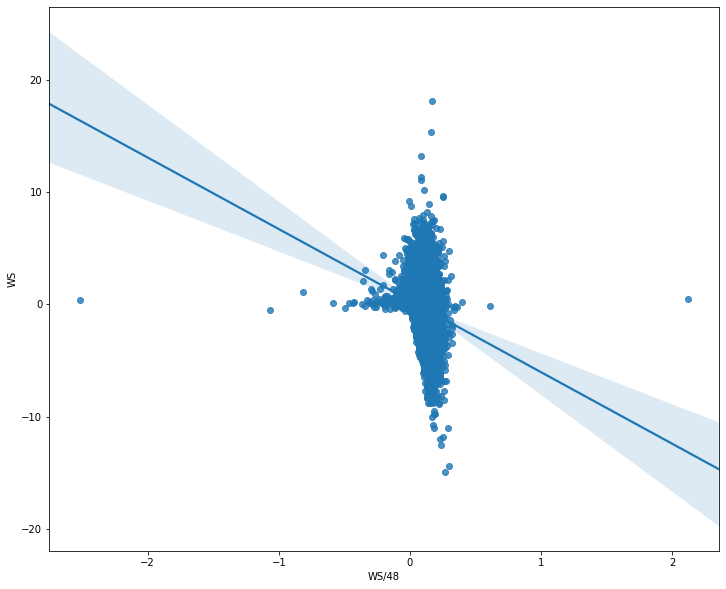

In [141]:
fig,ax_ws48reg = plt.subplots(1,1,figsize = (12,10))
sns_ws48reg = sns.regplot(x = X_train["WS/48"], y = y_train["WS"], ax = ax_ws48reg)

In [142]:
corr_coef_ws48,p_val_corr_ws48 = pearsonr(X_train["WS/48"],y_train["WS"])
print('Correlation Coefficient : {}'.format(corr_coef_ws48))
print('Correlation Coefficient P Value : {}'.format(p_val_corr_ws48))

Correlation Coefficient : -0.20630995287959047
Correlation Coefficient P Value : 2.807394127857331e-88


There is a significant negative correlation between WS/48 and change in WS. All groups mean Y2Y change in WS are statistically different from each other. 

(-0.5, 0.3)

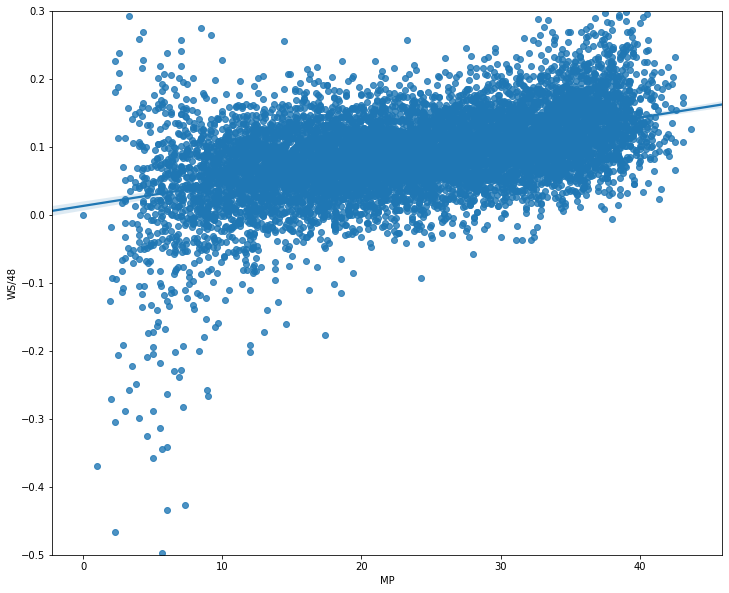

In [143]:
fig,ax_ws48mpreg = plt.subplots(1,1,figsize = (12,10))
sns_ws48mpreg = sns.regplot(x = X_train["MP"], y = X_train["WS/48"], ax = ax_ws48mpreg)
ax_ws48mpreg.set_ylim([-0.5,0.3])

From the above figure we see that players with more playing minutes have higher WS/48 values.

In [144]:
#class to make the different Player Skill groups
from sklearn.base import BaseEstimator
from sklearn.base import TransformerMixin

class playerskill(BaseEstimator, TransformerMixin):
    def __init__(self):
        return None
    def fit(self,X):
        return self
    def transform(self,X):
        X.loc[X["WS/48"].apply(lambda x: x<= 0.058), 'Player Skill'] = "Scrub"
        X.loc[X["WS/48"].apply(lambda x: ((x>0.058) & (x<= 0.092))), 'Player Skill'] = "Rotational"
        X.loc[X["WS/48"].apply(lambda x: ((x>0.092) & (x<= 0.127))), 'Player Skill'] = "Solid"
        X.loc[X["WS/48"].apply(lambda x: x> 0.127), 'Player Skill'] = "Star"   
        return X

In [145]:
#adding player skill to mail training dataset
X_train = playerskill().fit_transform(X_train)
X_train.head()

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Player Skill
1160,352,Aaron Brooks,2015-16,31.0,CHI,NBA,PG,69.0,0.0,16.1,...,-1.2,-0.1,-0.4,-0.6,-0.3,-0.1,-0.7,-0.4,-4.5,Scrub
5197,1625,Toni Kukoc,2004-05,36.0,MIL,NBA,SF,53.0,6.0,20.7,...,-1.5,-0.2,-0.5,0.3,-0.1,-0.1,-0.3,-0.2,-2.8,Rotational
5940,1866,George McCloud,1996-97,29.0,TOT,NBA,SF,64.0,28.0,23.3,...,-1.2,-0.9,-1.1,-1.0,-0.4,-0.4,-1.1,-0.7,-8.6,Solid
3815,1170,Othella Harrington,2005-06,32.0,CHI,NBA,C,72.0,23.0,11.4,...,-0.8,-0.7,-1.3,-0.3,-0.2,-0.1,-0.4,-0.9,-3.2,Rotational
10131,3207,Tyler Zeller,2013-14,24.0,CLE,NBA,C,70.0,9.0,15.0,...,-0.3,-0.6,-1.0,-0.7,-0.2,-0.4,-0.3,-1.3,-2.2,Solid


In [146]:
y_train.shape

(9124, 1)

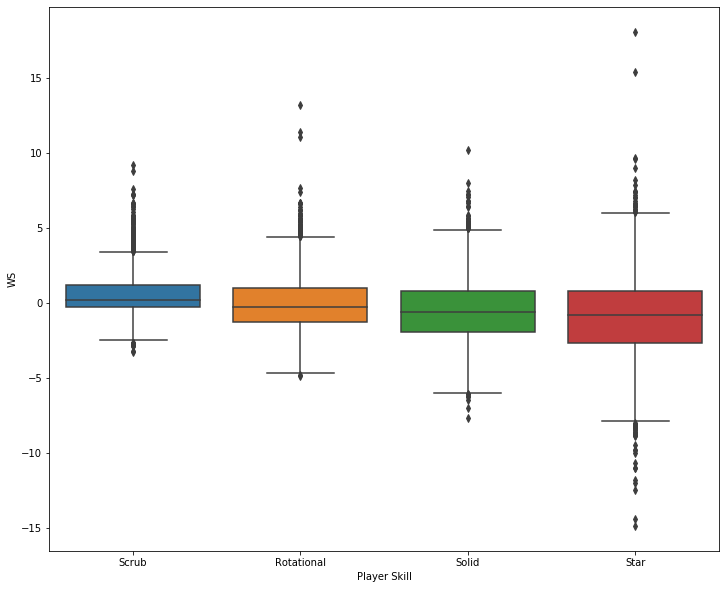

In [147]:
visual_skill = pd.concat([X_train, y_train], axis = 1)
fig,ax_skill_ws = plt.subplots(1,1,figsize = (12,10))
sns_skill_ws = sns.boxplot(x = visual_skill["Player Skill"], y = visual_skill["WS"], ax = ax_skill_ws)


Observations of the above figure:
- The mean change in WS decreases from Scrub to Star which proves the hypothesis that the room for improvement decreases with increased skill of a player. 
- The number of outliers in the Star category is much higher and should be investigated further

Hypothesis for the above set of outliers for players who are Stars:
- Players with large drops in WS the following season may be due to injury the following season, reduced games, mid season trades or other causes resulting in reduced game time. 
- Players with large increases in WS the following season may be due to a comeback from injury the following season causing a jump in the WS value. 

Furthermore, given the importance of start players and their contribution, dips/increases in their WS statistics are **magnified** as they tend to return to normal the next season causing a jump in WS, or in the case of a drop in WS the next season, it tends to fall heavily. 

In [148]:
star_ws_stats = visual_skill.loc[visual_skill["Player Skill"] == "Star"]["WS"].describe()
star_ws_stats

count    2240.000000
mean       -0.983661
std         2.972027
min       -14.900000
25%        -2.700000
50%        -0.800000
75%         0.800000
max        18.100000
Name: WS, dtype: float64

In [149]:
#outlier boundaries
IQR = star_ws_stats["75%"] - star_ws_stats["25%"]
high_outlier = star_ws_stats["75%"] + 1.5*IQR
low_outlier = star_ws_stats["25%"] - 1.5*IQR

In [150]:
star_increasews = visual_skill.loc[(visual_skill["Player Skill"] == "Star") & ((visual_skill["WS"] > high_outlier))]
star_increasews

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Player Skill,WS
6775,2135,Shaquille O'Neal,1998-99,26.0,LAL,NBA,C,49.0,49.0,34.8,...,0.3,-1.0,-0.1,0.0,-0.7,-0.4,0.0,-2.0,Star,9.6
6437,2028,Alonzo Mourning,2000-01,30.0,MIA,NBA,C,13.0,3.0,23.5,...,0.0,-1.7,-0.7,-0.2,-1.3,-0.5,-2.1,-8.1,Star,6.5
7718,2411,Doc Rivers,1985-86,24.0,ATL,NBA,PG,53.0,50.0,29.6,...,-0.1,0.0,2.5,-0.1,-0.6,0.1,-0.1,-2.6,Star,6.1
4151,1296,Al Horford,2011-12,25.0,ATL,NBA,C,11.0,11.0,31.6,...,0.0,-2.4,-1.3,0.1,0.3,0.0,-0.6,-2.9,Star,7.5
3375,1022,Rudy Gobert,2015-16,23.0,UTA,NBA,C,61.0,60.0,31.7,...,0.2,1.3,0.2,-0.1,-0.1,0.5,0.6,0.7,Star,7.9
9472,2997,Chris Webber,1995-96,22.0,WSB,NBA,PF,15.0,15.0,37.2,...,-1.2,-0.8,0.3,0.3,-1.0,0.2,0.0,3.6,Star,7.4
5205,1634,Raef LaFrentz,2003-04,27.0,BOS,NBA,C,17.0,1.0,19.3,...,0.0,-0.1,0.6,0.0,-0.5,-0.1,-1.0,-1.5,Star,6.6
8613,2708,John Stockton,1986-87,24.0,UTA,NBA,PG,82.0,2.0,22.7,...,0.0,-0.3,0.8,0.3,0.1,0.0,-0.1,0.2,Star,7.4
7436,2317,Mark Price,1990-91,26.0,CLE,NBA,PG,16.0,16.0,35.7,...,-0.4,-0.2,1.3,1.0,0.0,0.6,0.2,-2.7,Star,7.1
2646,785,Kevin Durant,2008-09,20.0,OKC,NBA,SF,74.0,74.0,39.0,...,0.1,2.0,0.4,0.3,-0.2,0.1,0.3,5.0,Star,8.2


In [151]:
star_dropws = visual_skill.loc[(visual_skill["Player Skill"] == "Star") & ((visual_skill["WS"] < low_outlier))]
star_dropws

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,Player Skill,WS
5820,1825,Jamal Mashburn,2002-03,30.0,NOH,NBA,SF,82.0,81.0,40.5,...,0.0,0.0,1.3,-0.1,0.0,0.0,0.4,0.1,Star,-8.3
239,77,Kenny Anderson,1996-97,26.0,POR,NBA,PG,82.0,81.0,37.6,...,0.2,1.3,-1.2,0.4,0.0,0.3,0.1,2.3,Star,-8.7
485,146,Vin Baker,1997-98,26.0,SEA,NBA,C,82.0,82.0,35.9,...,0.1,-2.4,-0.8,0.1,-0.4,-1.0,-0.1,-1.8,Star,-10.0
4908,1535,Michael Jordan,1992-93,29.0,CHI,NBA,SG,78.0,78.0,39.3,...,0.6,-0.3,-0.6,0.5,-0.1,0.2,-0.1,2.5,Star,-14.9
2651,785,Kevin Durant,2013-14,25.0,OKC,NBA,SF,81.0,81.0,38.5,...,0.1,-0.6,0.9,-0.1,-0.6,0.0,0.3,3.9,Star,-14.4
6436,2028,Alonzo Mourning,1999-00,29.0,MIA,NBA,C,79.0,78.0,34.8,...,-0.9,-0.6,0.0,-0.2,-0.2,-0.3,0.4,1.6,Star,-12.0
4740,1471,Magic Johnson,1990-91,31.0,LAL,NBA,PG,79.0,79.0,37.1,...,-0.3,0.6,1.0,-0.4,-0.2,0.3,-0.2,-2.9,Star,-11.8
7435,2317,Mark Price,1989-90,25.0,CLE,NBA,PG,73.0,73.0,37.1,...,0.3,0.1,0.7,0.1,0.0,0.1,-0.1,0.7,Star,-8.1
8573,2693,Lance Stephenson,2013-14,23.0,IND,NBA,SG,78.0,78.0,35.3,...,0.6,2.6,1.7,-0.3,-0.1,1.3,0.4,5.0,Star,-8.3
4540,1413,Richard Jefferson,2003-04,23.0,NJN,NBA,SF,82.0,82.0,38.2,...,-0.6,-0.3,1.3,0.1,-0.3,0.4,0.0,3.0,Star,-8.6


In [152]:
key_list_WS_decrease = list()

for (playerID,season) in zip(star_dropws["PlayerID"],star_dropws["Season"]):
    next_season = str(int(season.split('-')[0]) + 1) + '-' + "{:02d}".format(int(season.split('-')[1]) + 1)
    key_list_WS_decrease.append((playerID,next_season))

In [153]:
key_list_WS_decrease

[(1825, '2003-04'),
 (77, '1997-98'),
 (146, '1998-99'),
 (1535, '1993-94'),
 (785, '2014-15'),
 (2028, '2000-01'),
 (1471, '1991-92'),
 (2317, '1990-91'),
 (2693, '2014-15'),
 (1413, '2004-05'),
 (449, '2001-02'),
 (324, '2007-08'),
 (1261, '2000-01'),
 (483, '2004-05'),
 (660, '2008-09'),
 (397, '2013-14'),
 (2219, '2009-10'),
 (831, '2008-09'),
 (2143, '2011-12'),
 (1467, '1997-98'),
 (1703, '1990-91'),
 (781, '2008-09'),
 (2352, '2011-12'),
 (1742, '2012-13'),
 (1535, '1998-99'),
 (1413, '2006-07'),
 (1985, '1986-87'),
 (481, '1984-85'),
 (1296, '2011-12'),
 (271, '1995-96'),
 (2718, '2008-09'),
 (1360, '2008-09')]

In [154]:
outliers_ws_decrease = None
i = 0
for (playerid,season) in key_list_WS_decrease:
    if i == 0:
        outliers_ws_decrease = season_change_df.loc[(season_change_df["PlayerID"] == playerid) & (season_change_df["Season"] == season)]
        i = 1
    else:
        temp = season_change_df.loc[(season_change_df["PlayerID"] == playerid) & (season_change_df["Season"] == season)]
        outliers_ws_decrease = pd.concat([outliers_ws_decrease,temp],axis = 0)

In [155]:
#This dataframe shows the statistics of the Star players in the next season in which a big decrease in WS was seen
#this season they have a bad season so they are predicted to have bad season from prior season
outliers_ws_decrease["Total Minutes"] = outliers_ws_decrease["G"] * outliers_ws_decrease["MP"]
outliers_ws_decrease

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,DRB,AST,STL,BLK,TOV,PF,PTS,WS,MIP,Total Minutes
8587,1825,Jamal Mashburn,2003-04,31.0,NOH,NBA,SF,19.0,18.0,38.4,...,-0.1,-3.1,-0.3,0.1,-0.9,-0.2,-0.8,-8.3,0,729.6
357,77,Kenny Anderson,1997-98,27.0,TOT,NBA,PG,61.0,56.0,30.5,...,-1.1,-1.4,-0.6,-0.2,-0.1,-0.5,-5.3,-8.7,0,1860.5
707,146,Vin Baker,1998-99,27.0,SEA,NBA,PF,34.0,31.0,34.2,...,-0.8,-0.3,-0.2,0.0,0.1,0.2,-5.4,-10.0,0,1162.8
3833,785,Kevin Durant,2014-15,26.0,OKC,NBA,SF,27.0,27.0,33.8,...,-0.7,-1.4,-0.4,0.2,-0.8,-0.6,-6.6,-14.4,0,912.6
9500,2028,Alonzo Mourning,2000-01,30.0,MIA,NBA,C,13.0,3.0,23.5,...,-1.7,-0.7,-0.2,-1.3,-0.5,-2.1,-8.1,-12.0,0,305.5
10931,2317,Mark Price,1990-91,26.0,CLE,NBA,PG,16.0,16.0,35.7,...,-0.2,1.3,1.0,0.0,0.6,0.2,-2.7,-8.1,0,571.2
12653,2693,Lance Stephenson,2014-15,24.0,CHO,NBA,SG,61.0,25.0,25.8,...,-2.0,-0.7,-0.1,0.0,-0.6,-0.3,-5.6,-8.3,0,1573.8
6678,1413,Richard Jefferson,2004-05,24.0,NJN,NBA,SF,33.0,33.0,41.1,...,1.5,0.2,-0.1,0.2,1.6,0.6,3.7,-8.6,0,1356.3
2137,449,Marcus Camby,2001-02,27.0,NYK,NBA,C,29.0,29.0,34.7,...,-0.4,0.3,0.2,-0.5,0.4,0.4,-0.9,-8.2,0,1006.3
1562,324,Elton Brand,2007-08,28.0,LAC,NBA,PF,8.0,6.0,34.3,...,-0.6,-0.9,-0.6,-0.3,-0.4,-0.4,-2.9,-11.0,0,274.4


In [156]:
key_list_WS_increase = list()

for (playerid,season) in zip(star_increasews["PlayerID"],star_increasews["Season"]):
    key_list_WS_increase.append((playerid,season))

In [157]:
key_list_WS_increase

[(2135, '1998-99'),
 (2028, '2000-01'),
 (2411, '1985-86'),
 (1296, '2011-12'),
 (1022, '2015-16'),
 (2997, '1995-96'),
 (1634, '2003-04'),
 (2708, '1986-87'),
 (2317, '1990-91'),
 (785, '2008-09'),
 (171, '2000-01'),
 (1535, '1985-86'),
 (2261, '2006-07'),
 (1744, '2012-13'),
 (785, '2014-15'),
 (1742, '2009-10'),
 (2119, '1999-00'),
 (785, '2011-12'),
 (397, '2004-05'),
 (1535, '1994-95'),
 (971, '1998-99'),
 (2427, '1992-93'),
 (639, '2011-12'),
 (292, '2005-06')]

In [158]:
outliers_ws_increase = None
i = 0
for (playerid,season) in key_list_WS_increase:
    if i == 0:
        outliers_ws_increase = season_change_df.loc[(season_change_df["PlayerID"] == playerid) & (season_change_df["Season"] == season)]
        i = 1
    else:
        temp = season_change_df.loc[(season_change_df["PlayerID"] == playerid) & (season_change_df["Season"] == season)]
        outliers_ws_increase = pd.concat([outliers_ws_increase,temp],axis = 0)

In [159]:
#this season they have a bad season so they are predicted to have a comeback season from next season
outliers_ws_increase

,PlayerID,Name,Season,Age,Tm,Lg,Pos,G,GS,MP,...,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,WS,MIP
9996,2135,Shaquille O'Neal,1998-99,26.0,LAL,NBA,C,49.0,49.0,34.8,...,0.3,-1.0,-0.1,0.0,-0.7,-0.4,0.0,-2.0,-1.2,0
9500,2028,Alonzo Mourning,2000-01,30.0,MIA,NBA,C,13.0,3.0,23.5,...,0.0,-1.7,-0.7,-0.2,-1.3,-0.5,-2.1,-8.1,-12.0,0
11344,2411,Doc Rivers,1985-86,24.0,ATL,NBA,PG,53.0,50.0,29.6,...,-0.1,0.0,2.5,-0.1,-0.6,0.1,-0.1,-2.6,-2.1,0
6118,1296,Al Horford,2011-12,25.0,ATL,NBA,C,11.0,11.0,31.6,...,0.0,-2.4,-1.3,0.1,0.3,0.0,-0.6,-2.9,-8.8,0
4921,1022,Rudy Gobert,2015-16,23.0,UTA,NBA,C,61.0,60.0,31.7,...,0.2,1.3,0.2,-0.1,-0.1,0.5,0.6,0.7,-2.9,0
14005,2997,Chris Webber,1995-96,22.0,WSB,NBA,PF,15.0,15.0,37.2,...,-1.2,-0.8,0.3,0.3,-1.0,0.2,0.0,3.6,-2.1,0
7681,1634,Raef LaFrentz,2003-04,27.0,BOS,NBA,C,17.0,1.0,19.3,...,0.0,-0.1,0.6,0.0,-0.5,-0.1,-1.0,-1.5,-4.9,0
12714,2708,John Stockton,1986-87,24.0,UTA,NBA,PG,82.0,2.0,22.7,...,0.0,-0.3,0.8,0.3,0.1,0.0,-0.1,0.2,0.8,0
10931,2317,Mark Price,1990-91,26.0,CLE,NBA,PG,16.0,16.0,35.7,...,-0.4,-0.2,1.3,1.0,0.0,0.6,0.2,-2.7,-8.1,0
3827,785,Kevin Durant,2008-09,20.0,OKC,NBA,SF,74.0,74.0,39.0,...,0.1,2.0,0.4,0.3,-0.2,0.1,0.3,5.0,5.6,0


In [160]:
outliers_ws_increase["Total Minutes"] = outliers_ws_increase["G"] * outliers_ws_increase["MP"]

In [161]:
#hypothesis for players showing severe drops in WS the next season is that they have a reduction in the Minutes Played the next season as compared to current season
drop_in_minutes = None
name_list = list()
min_change_list = list()
i = 0
for (playerid,season) in key_list_WS_decrease:
    current_season = season
    previous_season = str(int(season.split('-')[0]) - 1) + '-' + "{:02d}".format(int(season.split('-')[1]) - 1)
    temp1 = star_dropws.loc[(star_dropws["PlayerID"] == playerid) & (star_dropws["Season"] == previous_season)]
    temp2 = outliers_ws_decrease.loc[(outliers_ws_decrease["PlayerID"] == playerid) & (outliers_ws_decrease["Season"] == current_season)]
    try:
        change_in_minutes = (int(temp2["MP"].item()) * int(temp2["G"].item())) - (int(temp1["MP"].item()) * int(temp1["G"].item()))
    except:
        #some players either retire or do not play the season completely next season, hence we put these as NaN
        change_in_minutes = np.NaN
    name_list.append(temp1["Name"].item())
    min_change_list.append(change_in_minutes)
drop_in_minutes = pd.DataFrame({'Player':name_list, 'Change in minutes':min_change_list})

drop_in_minutes

,Player,Change in minutes
0,Jamal Mashburn,-2558.0
1,Kenny Anderson,-1204.0
2,Vin Baker,-1714.0
3,Michael Jordan,NaN
4,Kevin Durant,-2187.0
5,Alonzo Mourning,-2387.0
6,Magic Johnson,NaN
7,Mark Price,-2141.0
8,Lance Stephenson,-1205.0
9,Richard Jefferson,-1763.0


In [162]:
drop_in_minutes["Change in minutes"].mean()

-1768.923076923077

<h3> The hypothesis with regards to steep drops in WS is correct. Star Players who have a steep drop in WS the following season tend to have much lower playing minutes during the following season causing their productivity to decrease and hence a drop in WS </h3> 

In [163]:
increase_in_minutes = None
name_list = list()
min_change_list_2 = list()
i = 0
for (playerid,season) in key_list_WS_increase:
    current_season = season
    if(current_season == '1998-99'):
        next_season = '1999-00'
    else:
        next_season = str(int(season.split('-')[0]) + 1) + '-' + "{:02d}".format(int(season.split('-')[1]) + 1)
    temp1 = star_increasews.loc[(star_increasews["PlayerID"] == playerid) & (star_increasews["Season"] == current_season)]
    temp2 = season_change_df.loc[(season_change_df["PlayerID"] == playerid) & (season_change_df["Season"] == next_season)]
    try:
        change_in_minutes = (int(temp2["MP"].item()) * int(temp2["G"].item())) - (int(temp1["MP"].item()) * int(temp1["G"].item()))
    except:
        #some players either retire or do not play the season completely next season, hence we put these as NaN
        change_in_minutes = np.NaN
    name_list.append(temp1["Name"].item())
    min_change_list_2.append(change_in_minutes)
increase_in_minutes = pd.DataFrame({'Player':name_list, 'Change in minutes':min_change_list_2})

increase_in_minutes

,Player,Change in minutes
0,Shaquille O'Neal,1494
1,Alonzo Mourning,2101
2,Doc Rivers,1005
3,Al Horford,2397
4,Rudy Gobert,782
5,Chris Webber,2253
6,Raef LaFrentz,1837
7,John Stockton,984
8,Mark Price,1528
9,Kevin Durant,312


In [164]:
increase_in_minutes["Change in minutes"].mean()

1344.75

<h3> The hypothesis with regards to increases in WS is correct. Star Players who have a very high increases in WS the following season tend to have much lower playing minutes in the current season causing their productivity to increase the next season when they get back to normal and hence an increase in WS </h3> 

It is impossible to predict if a player will have a short season next season, or a comeback season the next season. However we do not want our predictive model to be influenced by distorted values of WS which are impossible to be modelled for. Hence we shall make WS values that are outliers to be set to the players average WS change. 

In [189]:
from sklearn.base import TransformerMixin,BaseEstimator
class normalize_star_ws_outliers(TransformerMixin,BaseEstimator):
    def __init__(self):
        return None
    def fit(self,X,y=None):
        return self
    def transform(self,X,y=None):
        combined = pd.concat([X,y],axis = 1)
        combined_1 = combined.copy()
        star_ws_stats = combined.loc[combined["Player Skill"] == "Star"]["WS"].describe()
        high_outlier = star_ws_stats["75%"] + 1.5*IQR
        low_outlier = star_ws_stats["25%"] - 1.5*IQR
        star_increasews = combined.loc[(combined["Player Skill"] == "Star") & (combined["WS"] > high_outlier)]
        star_decreasews = combined.loc[(combined["Player Skill"] == "Star") & (combined["WS"] < low_outlier)]
        key_list = list()
        for (playerID,season) in zip(star_increasews["PlayerID"],star_increasews["Season"]):
            key_list.append((playerID,season))
        for (playerID,season) in zip(star_decreasews["PlayerID"],star_decreasews["Season"]):
            key_list.append((playerID,season))
        for (playerID,season) in key_list:
            average_WS = combined_1.loc[combined_1["PlayerID"] == playerID]["WS"].mean()
            combined.loc[((combined["PlayerID"] == playerID) & (combined["Season"] == season)),"WS"] = average_WS
        column_training = combined.columns.tolist()
        column_training.remove("WS")
        return combined[column_training],combined["WS"]

In [190]:
#with WS adjustment for Star Players
X_train_res = X_train.copy()
y_train_res = y_train.copy()

X_train, y_train = normalize_star_ws_outliers().transform(X = X_train_res,y = y_train_res)

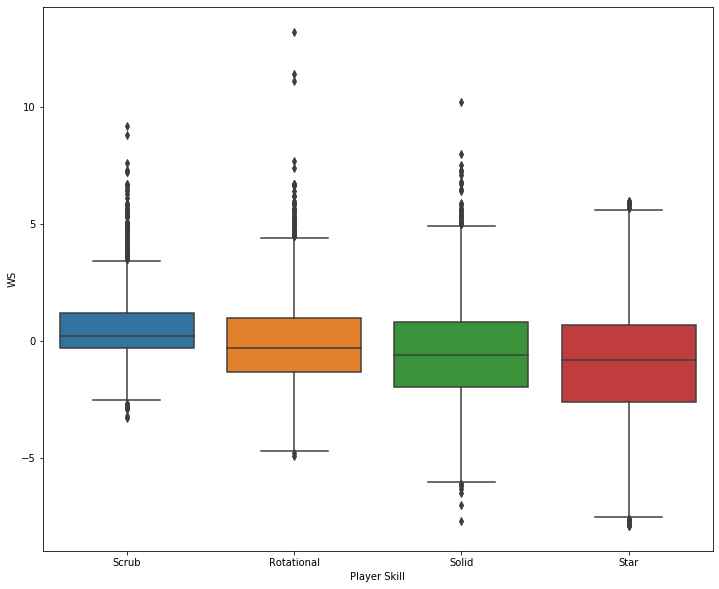

In [192]:
visual_skill_Star_norm = pd.concat([X_train,y_train],axis = 1)
fig,ax_skill_ws_star_norm = plt.subplots(1,1,figsize = (12,10))
sns_skill_ws_star_norm = sns.boxplot(x = visual_skill_Star_norm["Player Skill"], y = visual_skill_Star_norm["WS"], ax = ax_skill_ws_star_norm)

In [194]:
solid_ws_stats = visual_skill.loc[visual_skill["Player Skill"] == "Solid"]["WS"].describe()
solid_ws_stats

count    2311.000000
mean       -0.466075
std         2.256552
min        -7.700000
25%        -1.950000
50%        -0.600000
75%         0.800000
max        10.200000
Name: WS, dtype: float64

<h3> Investigating the increase/decline of 3 points made and it's impact on WS</h3>

In [150]:
X_train["3P"].describe()

count    9124.000000
mean        0.029855
std         0.325904
min        -2.000000
25%         0.000000
50%         0.000000
75%         0.100000
max         2.500000
Name: 3P, dtype: float64

In [151]:
y_train.iloc[X_train.loc[X_train["Player Skill"] == "Rotational"].index.tolist(),:]

IndexError: positional indexers are out-of-bounds

In [ ]:
fig,ax_3p = plt.subplots(1,1,figsize = (12,10))
sns_3p = sns.regplot(x = X_train.loc[X_train["Player Skill"] == "Rotational"]["3P"], y = y_train.iloc,:]["WS"], ax = ax_3p)
